# Gene programs


In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata
from math import ceil

import pickle as pkl
from sklearn.preprocessing import minmax_scale

import squidpy.gr as sqgr
import diffxpy.api as de

from matplotlib import rcParams
import matplotlib.pyplot as plt
import seaborn as sb
from matplotlib.patches import Patch

from sklearn.linear_model import LinearRegression

from scipy.cluster.hierarchy import linkage,dendrogram,fcluster,leaves_list
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
pandas2ri.activate()
%load_ext rpy2.ipython

import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

import sys
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/diabetes_analysis/')
import helper as h
import importlib
importlib.reload(h)
import helper as h

In [2]:
ro.r('library("hypeR")')
ro.r("source(paste(Sys.getenv('WSCL'),'diabetes_analysis/data_exploration/','helper_hypeR.R',sep=''))")
ro.r('library(pvclust)')

array(['pvclust', 'visNetwork', 'msigdbr', 'hypeR', 'tools', 'stats',
       'graphics', 'grDevices', 'utils', 'datasets', 'methods', 'base'],
      dtype='<U10')

In [3]:
path_data='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/'
path_save='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/moransi/sfintegrated/'

In [4]:
# load genes info for expression, rel beta expression, and citation info
genes_info=pd.read_table('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/genePrioritisation_beta.tsv',index_col=0)

In [5]:
# Saving figures
path_fig='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/figures/paper/'

In [6]:
adata_rn_b=sc.read(path_data+'data_rawnorm_integrated_analysed_beta_v1s1_sfintegrated.h5ad')
adata_rn_b.shape

(102143, 30672)

## Prepare data

### Subset data

Remove low quality clusters

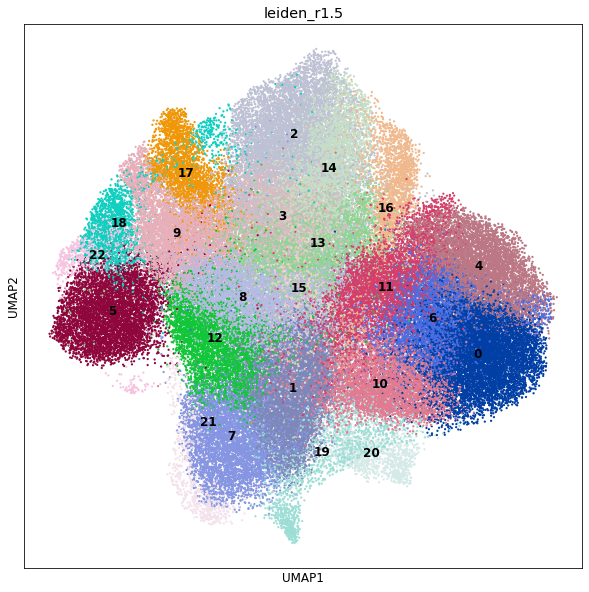

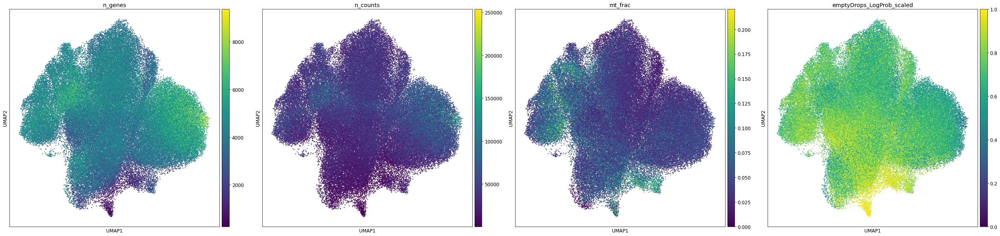

In [108]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_rn_b,color=['leiden_r1.5'],
           s=20,legend_loc='on data')
sc.pl.umap(adata_rn_b,color=['n_genes','n_counts','mt_frac','emptyDrops_LogProb_scaled'],
           s=20)

C: Clusters 19 and 20 will be removed due to poor quality - their low expression could affect results. 

In [7]:
adata_rn_b_sub=adata_rn_b[~adata_rn_b.obs['leiden_r1.5'].isin(['19','20']),:].copy()
adata_rn_b_sub.shape

(99361, 30672)

In [8]:
# Drop clustering info
adata_rn_b_sub.obs.drop([col for col in adata_rn_b_sub.obs.columns  if 'leiden' in col ],
                       axis=1,inplace=True)

In [7]:
sc.pp.neighbors(adata_rn_b_sub,n_pcs=0,use_rep='X_integrated')
sc.tl.umap(adata_rn_b_sub)

Remove lowly expressed/likely ambient non beta genes

In [9]:
# Remove genes expressed in less than 20 cells
sc.pp.filter_genes(adata_rn_b_sub, min_cells=20)
adata_rn_b_sub.shape

(99361, 19331)

In [10]:
# remove ambient non-beta genes
ambient_nonbeta=pkl.load(open('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/ambient/ambient_nonbeta.pkl','rb'))
adata_rn_b_sub=adata_rn_b_sub[:,[g for g in adata_rn_b_sub.var_names 
                         if g not in set(ambient_nonbeta['ambient_nonbeta'])]]
adata_rn_b_sub.shape

(99361, 18965)

In [11]:
# Add full gene symbol info
adata_rn_b_sub.var['gene_symbol']=h.get_symbols(adata_rn_b_sub.var_names)
# Check that gene symbols not nan -
if (adata_rn_b_sub.var.gene_symbol=='nan').sum() :
        raise ValueError('Some gene symbols are nan - requires different parsing')

Trying to set attribute `.var` of view, copying.


### Make fine clusters for pseudobulk (for gene clustering)

In [ ]:
res=20
sc.tl.leiden(adata_rn_b_sub, resolution=res, key_added='leiden_r'+str(res), 
             directed=True, use_weights=True)

In [15]:
print('N clusters:',adata_rn_b_sub.obs['leiden_r'+str(res)].nunique())
print('Min cl size:',adata_rn_b_sub.obs['leiden_r'+str(res)].value_counts().min())
print('Max cl size:',adata_rn_b_sub.obs['leiden_r'+str(res)].value_counts().max())

N clusters: 422
Min cl size: 40
Max cl size: 705


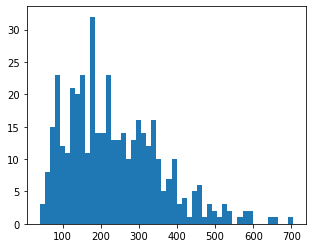

In [16]:
# Cluster size distn
rcParams['figure.figsize']=(5,4)
a=plt.hist(adata_rn_b_sub.obs['leiden_r'+str(res)].value_counts().values,bins=50)

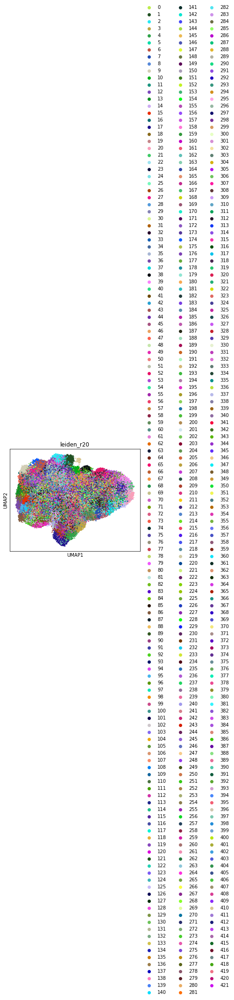

In [17]:
# Clusters on UMAP
colors = []
n = adata_rn_b_sub.obs['leiden_r'+str(res)].nunique()
for i in range(n):
    colors.append('#%06X' % np.random.randint(0, 0xFFFFFF))
adata_rn_b_sub.uns['leiden_r'+str(res)+'_colors']=colors
sc.pl.umap(adata_rn_b_sub,color='leiden_r'+str(res),s=20)

In [21]:
# Get clusters
cell_cl=adata_rn_b_sub.obs['leiden_r'+str(res)]

In [24]:
# Save clusters
cell_cl.to_csv(path_save+'cell_leiden_r'+str(res)+'.tsv',sep='\t')

## Compute Moran's I
Select genes variable across integrated embedding.

### Check I statistic  vs pvals

Calculate Moran's I for a few genes to check if p-values will be useful (it was seen before that they might be too small to discriminate between genes well). 

In [25]:
sqgr.moran( adata=adata_rn_b_sub,
            connectivity_key='connectivities',genes=adata_rn_b_sub.var_names[:100], 
            transformation = "r",
            n_perms = 100, corr_method="fdr_bh",layer= None,seed=0,n_jobs= 4)

  0%|          | 0/100 [00:00<?, ?/s]

Text(0, 0.5, 'log(padj+10**-100)')

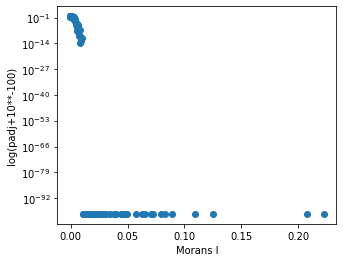

In [26]:
plt.scatter(adata_rn_b_sub.uns['moranI']['I'],
            adata_rn_b_sub.uns['moranI']['pval_sim_fdr_bh'].values+10**-100)
plt.yscale('log')
plt.xlabel('Morans I')
plt.ylabel('log(padj+10**-100)')

C: It seems that pvals will not be useful, as they fall to 0 at high Moran's I values. These p-values should be based on Normality assumption so increasing permutations should not help. Thus we can use scanpy implementation that does not compute pvals.

In [28]:
del adata_rn_b_sub.uns['moranI']

### Compute I

Compute Moran's I on log-transgormed normalised data using row scaling of Moran's I.

In [29]:
# Compute morans i
morans_i=sc.metrics.morans_i(adata_rn_b_sub)
morans_i=pd.Series(morans_i,index=adata_rn_b_sub.var_names)

In [30]:
# Save moransi
morans_i.to_csv(path_save+'moransi.tsv',sep='\t')

### Analyse I

In [31]:
# N cells expressing gene
adata_rn_b_sub.var['n_cells']=np.asarray((adata_rn_b_sub.X>0).sum(axis=0)).ravel()

In [33]:
thr=0.1

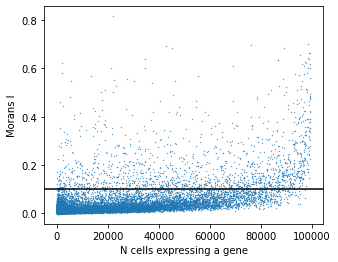

In [32]:
plt.scatter(adata_rn_b_sub.var['n_cells'],morans_i,s=0.1)
plt.xlabel('N cells expressing a gene')
plt.ylabel('Morans I')
plt.axhline(thr,c='k')

C: It seems that there is some dependency between expression and Moran's I. This may be a mixture of both bio and technical effect, as highly expressed genes are likley to be important for cell biology of this cell type. On the other hand this may miss genes important only in subset of cells.

#### Regress out gene expression sparsity effect
As Moran's I dependence to gene sparsity may have also bio component - e.g. less sparse genes are probably bio important and thus variable (higher I - both min and distn shape shift) try to fit a line to lowest I at certain gene expression sparsity level (e.g. Regressing out base level of Moran's I at each expression sparsity level).

Subset genes to n cells expr<40000 and then bin it into 20 n_cells categories and select 5 lowest Moran's I instances from each bin. This should estimate base Moran's I for each bin.

In [43]:
# Select base-level I genes for regression
part=adata_rn_b_sub.var['n_cells']<40000
bins=pd.cut(adata_rn_b_sub.var['n_cells'][part],bins=20).to_frame()
bins.columns=['bins']
bins['morans_i']=morans_i[part]
eids=bins.groupby('bins').apply(lambda x: x.loc[x.sort_values('morans_i').index[:5],:]).drop(
    'bins',axis=1).reset_index()['EID']

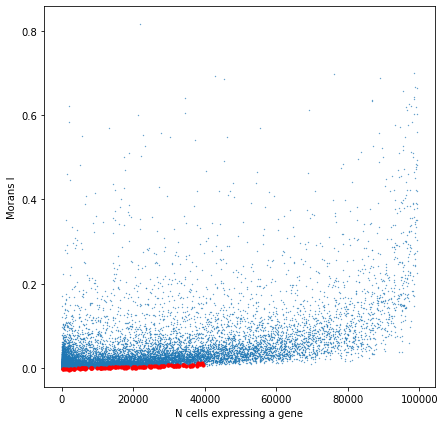

In [44]:
# Plot all and selected Moran's instances
plt.scatter(adata_rn_b_sub.var['n_cells'],morans_i,s=0.1)
plt.xlabel('N cells expressing a gene')
plt.ylabel('Morans I')
plt.scatter(adata_rn_b_sub.var.loc[eids,'n_cells'],morans_i[eids],s=10,c='r')

In [45]:
# Base level regreession
reg_base = LinearRegression().fit(adata_rn_b_sub.var.loc[eids,'n_cells'].values.reshape(-1,1),
                             morans_i[eids].values.reshape(-1,1))

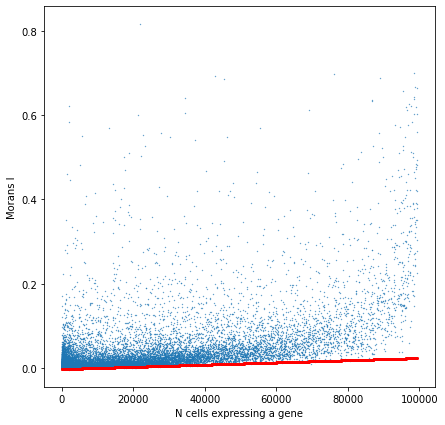

In [46]:
# Plot regression
plt.scatter(adata_rn_b_sub.var['n_cells'],morans_i,s=0.1)
plt.xlabel('N cells expressing a gene')
plt.ylabel('Morans I')
x_pred=range(adata_rn_b_sub.var['n_cells'].min(),adata_rn_b_sub.var['n_cells'].max(),10)
plt.scatter(x_pred,reg_base.predict(np.array(x_pred).reshape(-1,1)).ravel(),c='r',s=1)

Residual based on regression of base level of Moran's I

In [47]:
# residuals based on base-lvl I
morans_i_residual_base=pd.Series((morans_i.values.reshape(-1,1)-reg_base.predict(
    adata_rn_b_sub.var['n_cells'].values.reshape(-1,1))).ravel(),
                            index=morans_i.index)

#### Select genes based on expression-sparsity  adjusted Morans I score

In [48]:
thr=0.08

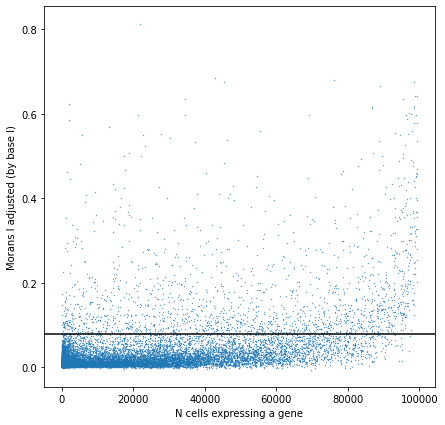

In [49]:
# Plot adjusted scores vs n_cells
plt.scatter(adata_rn_b_sub.var['n_cells'],morans_i_residual_base,s=0.1)
plt.xlabel('N cells expressing a gene')
plt.ylabel('Morans I adjusted (by base I)')
plt.axhline(thr,c='k')

C: Now the trend between Moran's I and expression sparsity seems to be gone.

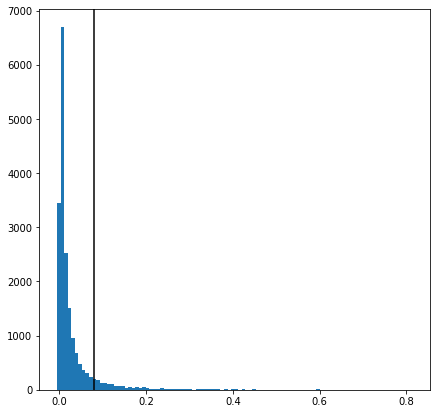

In [50]:
# Distn of adjusted scores 
a=plt.hist(morans_i_residual_base,bins=100)
plt.axvline(thr,c='k')

In [51]:
# N genes selected at this thr
(morans_i_residual_base>thr).sum()

1687

In [53]:
# Try a different thr as well
(morans_i_residual_base>0.2).sum()

454

#### Compare different gene selection thresholds

In [54]:
# Two sets of genes - more and less stringet
thr=0.08
genes=morans_i_residual_base.index[morans_i_residual_base>thr].tolist()
print('N geenes %i at thr %.2f'%(len(genes),thr))

thr2=0.2
genes2=morans_i_residual_base.index[morans_i_residual_base>thr2].tolist()
print('N geenes %i at thr %.2f'%(len(genes2),thr2))

N geenes 1687 at thr 0.08
N geenes 454 at thr 0.20


Visualise embedding of genes based on their expression properties for both gene selection thresholds

Plot embedding of genes with less stringent threshold

In [11]:
#res=20
#cl_col='leiden_r'+str(res)
#adata_rn_b_sub.obs[cl_col]=pd.read_table(path_save+'cell_leiden_r'+str(res)+'.tsv',index_col=0)

Trying to set attribute `.obs` of view, copying.


In [18]:
# Make df of genes vs mean expression across cell clusters 
cell_cls=adata_rn_b_sub.obs[cl_col].unique()
features=pd.DataFrame(index=genes,columns=cell_cls)
for cell_cl in cell_cls:
    features[cell_cl]=np.array(adata_rn_b_sub[
        adata_rn_b_sub.obs[cl_col]==cell_cl,features.index].X.mean(axis=0)).ravel()
    # prepare gene data for clustering
adata_genes=anndata.AnnData(features)
adata_genes.obs['I_residual_base']=morans_i_residual_base[adata_genes.obs_names]

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [57]:
# Embedding of genes for leiden
sc.pp.pca(adata_genes,n_comps=15)
sc.pp.neighbors(adata_genes,use_rep='X_pca',n_pcs =15,
                #metric='correlation',
                knn=5) 
sc.tl.umap(adata_genes)

In [58]:
sc.tl.leiden(adata_genes,resolution=1)

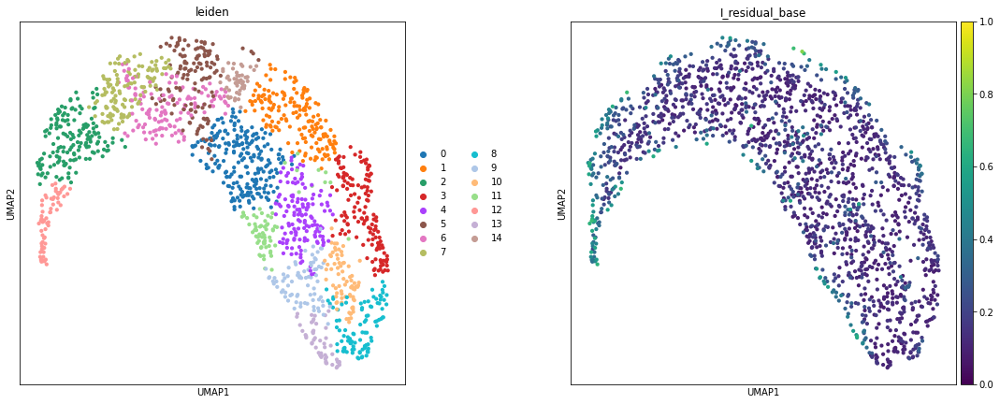

In [59]:
sc.pl.umap(adata_genes,color=['leiden','I_residual_base'],wspace=0.3,vmin=0,vmax=1)

Plot embedding of genes with more stringent threshold

In [16]:
# Make df of genes vs mean expression across cell clusters 
cell_cls=adata_rn_b_sub.obs[cl_col].unique()
features2=pd.DataFrame(index=genes2,columns=cell_cls)
for cell_cl in cell_cls:
    features2[cell_cl]=np.array(adata_rn_b_sub[
        adata_rn_b_sub.obs[cl_col]==cell_cl,features2.index].X.mean(axis=0)).ravel()
    # prepare gene data for clustering
adata_genes2=anndata.AnnData(features2)
adata_genes2.obs['I_residual_base']=morans_i_residual_base[adata_genes2.obs_names]

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [61]:
# Embedding of genes for leiden
sc.pp.pca(adata_genes2,n_comps=15)
sc.pp.neighbors(adata_genes2,use_rep='X_pca',n_pcs =15,
                #metric='correlation',
                knn=5) 
sc.tl.umap(adata_genes2)

In [62]:
sc.tl.leiden(adata_genes2,resolution=1)

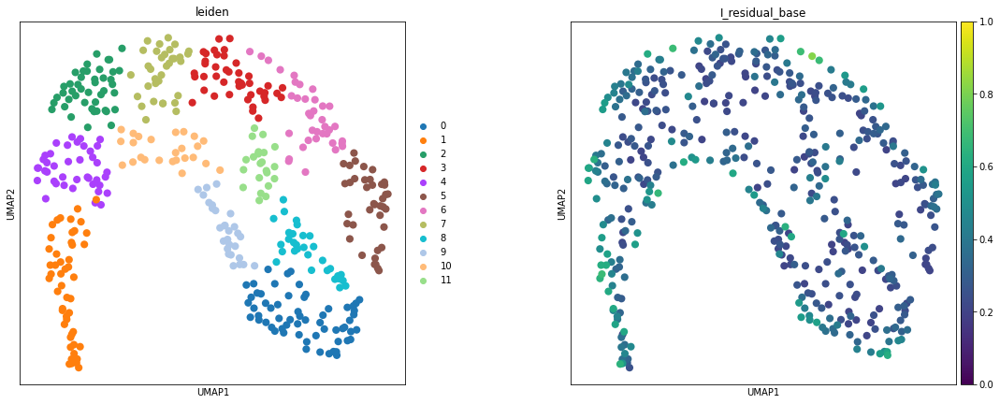

In [63]:
sc.pl.umap(adata_genes2,color=['leiden','I_residual_base'],wspace=0.3,vmin=0,vmax=1)

Compare stringent and less stringent thr genes

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'is_stringent' as categorical


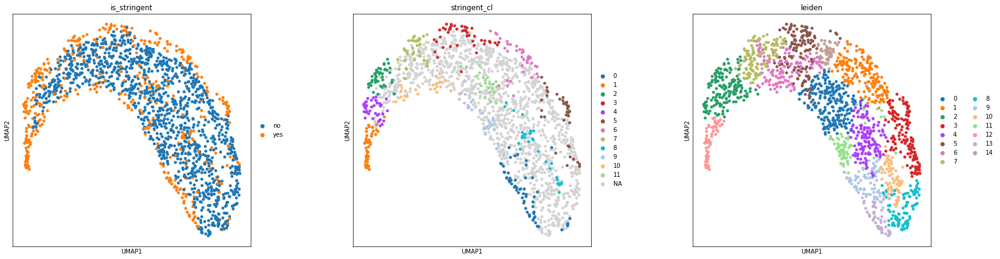

In [64]:
# Plot stringent genes on non-stringent umap
adata_genes.obs['stringent_cl']=adata_genes2.obs['leiden']
adata_genes.obs['is_stringent']=['yes' if g in genes2 else 'no' for g in adata_genes.obs_names]
sc.pl.umap(adata_genes,color=['is_stringent','stringent_cl','leiden'],wspace=0.3,s=100)
adata_genes.obs.drop(['stringent_cl','is_stringent'],axis=1,inplace=True)

C: Using less genes does not produce much more obvious clusters, but it may misss some gene clusters due to absence of genes in that region.

## Group genes
Group genes based on expression across fine cell pseudobulk

### Compute hierarchical clustering

In [68]:
# Compute hc
dist=pdist(features,metric='correlation')
hc=linkage(dist, method='ward',  optimal_ordering=True)

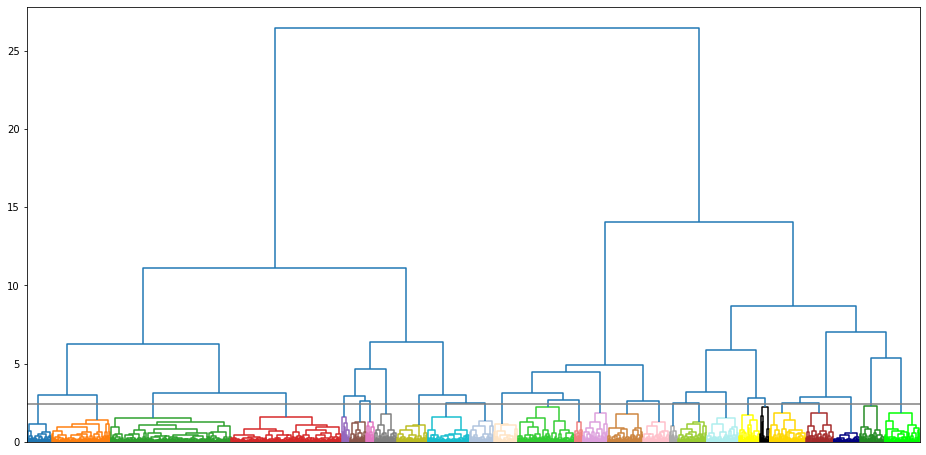

In [81]:
# Plot dendrogram
rcParams['figure.figsize']=(16,8)
adata_genes.uns['hc_colors']=['tab:blue',  'tab:orange','tab:green','tab:red', 'tab:purple',
                'tab:brown','tab:pink', 'tab:gray', 'tab:olive','tab:cyan',
                'lightsteelblue','bisque','limegreen','lightcoral','plum',
                'peru','pink','darkgrey','yellowgreen','paleturquoise','yellow','black',
                'gold','brown','navy','forestgreen','lime','lightsalmon','teal','olive']
hierarchy.set_link_color_palette(adata_genes.uns['hc_colors'])
cut_thresh=2.4
dend=dendrogram(hc,color_threshold=cut_thresh,no_labels=True)
plt.axhline(cut_thresh,c='gray')

In [82]:
# Extract clusters at selected cutting threshold
adata_genes.obs['hc']=fcluster(hc,t=cut_thresh,criterion='distance')
# Sort categories to match colors
adata_genes.obs['hc']=pd.Categorical(adata_genes.obs['hc'], 
                      categories=sorted(adata_genes.obs['hc'].unique()),
                      ordered=True)

print('N gene clusters:',adata_genes.obs.hc.nunique())

N gene clusters: 27


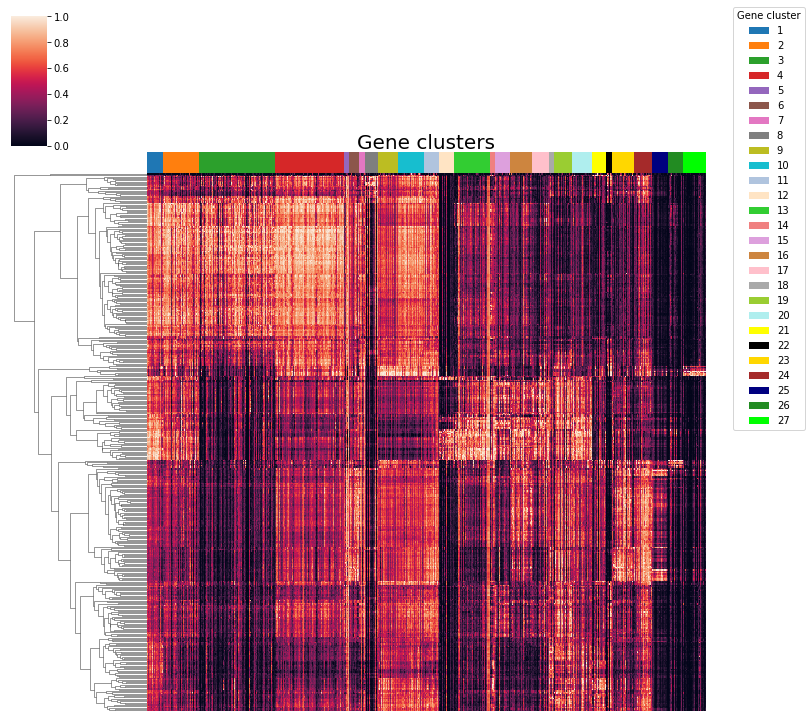

In [83]:
# Prepare some data for gene clusters heatmap
# Which clustering to show
gene_clustering='hc'
# ordered genes by clusters
gene_list=[gene for cl in adata_genes.obs[gene_clustering].cat.categories
           for gene in features.index[adata_genes.obs[gene_clustering]==cl]]
# ordered gene colors 
cl_list=[adata_genes.uns[gene_clustering+'_colors'][idx] for idx,cl in 
         enumerate(adata_genes.obs[gene_clustering].cat.categories)
         for gene in features.index[adata_genes.obs[gene_clustering]==cl]]

x_temp=pd.DataFrame(minmax_scale(features.T),
                    index=features.columns,columns=features.index)[gene_list]
fg=sb.clustermap(x_temp, 
              col_colors=cl_list, 
              col_cluster=False,row_cluster=True,
             xticklabels=False, yticklabels=False)
 # Adds block annotation titles as axis labels
fg.ax_col_colors.set_xlabel('Gene clusters',fontsize=20)
fg.ax_col_colors.xaxis.set_label_position('top') 
# legend for gene clusters
handles = [Patch(facecolor=c) for c in adata_genes.uns[gene_clustering+'_colors']]
plt.legend(handles, adata_genes.obs[gene_clustering].cat.categories, title='Gene cluster',
           bbox_to_anchor=(1.13, 1), bbox_transform=plt.gcf().transFigure)

C: HC seems to better resolve clusters, especially those with low expression

In [84]:
# Cluster sizes
adata_genes.obs['hc'].value_counts()

3     228
4     209
2     111
13    108
10     79
23     69
27     67
16     67
20     61
9      58
19     54
24     52
25     50
17     50
1      47
15     47
11     46
26     46
12     45
8      42
21     40
6      32
22     18
18     16
7      16
14     15
5      14
Name: hc, dtype: int64

### Gene cluster scores on cells

In [7]:
# gene cluster scores
gene_cl='hc'
adata_rn_b.obs.drop([col for col in adata_rn_b.obs.columns 
                     if 'gene_score_cluster_'+gene_cl in col],axis=1,inplace=True)
for ct in sorted(adata_genes.obs[gene_cl].unique()):
    score_name='gene_score_cluster_'+gene_cl+str(ct)
    sc.tl.score_genes(adata_rn_b, 
                      gene_list=adata_genes.obs_names[adata_genes.obs[gene_cl]==ct], 
                     score_name=score_name, use_raw=False)
    adata_rn_b.obs[score_name+'_scaled']=minmax_scale(adata_rn_b.obs[score_name])

Text(0.5, 1.0, 'Distribution of normalised gene program scores across cells')

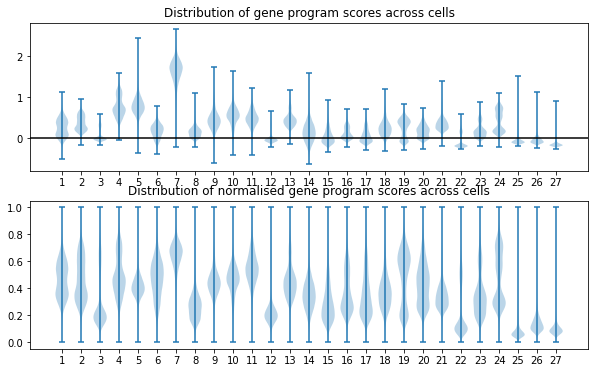

In [55]:
# Score distributions
fig,ax=plt.subplots(2,1,figsize=(10,6))
labels=[int(col.replace('gene_score_cluster_hc','').replace('_scaled',''))
                         for col in adata_rn_b.obs.columns 
                    if 'gene_score_cluster_'+gene_cl in col and '_scaled' not in col]
ax[0].violinplot(adata_rn_b.obs[[col for col in adata_rn_b.obs.columns 
                    if 'gene_score_cluster_'+gene_cl in col and '_scaled' not in col]],
              positions=labels,showextrema=True,widths=0.7,points=1000)
ax[0].axhline(0,c='k')
a=ax[0].set_xticks(labels)
ax[0].set_title('Distribution of gene program scores across cells')

labels=[int(col.replace('gene_score_cluster_hc','').replace('_scaled',''))
                         for col in adata_rn_b.obs.columns 
                    if 'gene_score_cluster_'+gene_cl in col and '_scaled'  in col]
ax[1].violinplot(adata_rn_b.obs[[col for col in adata_rn_b.obs.columns 
                    if 'gene_score_cluster_'+gene_cl in col and '_scaled' in col]],
              positions=labels,showextrema=True,widths=0.7,points=1000)
a=ax[1].set_xticks(labels)
ax[1].set_title('Distribution of normalised gene program scores across cells')

C: Some programs seem to have very lowly expressed genes in most cells.

Expression strength in expressing cells - distn across gene clusters.

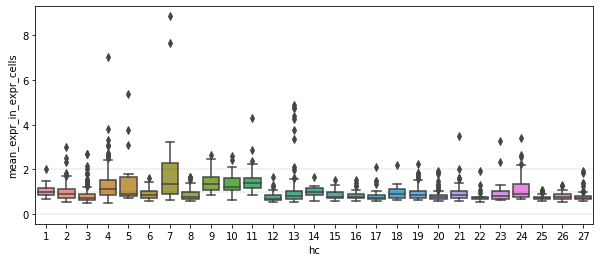

In [76]:
# boxplot of expression - do not use violiplots as they get odd scalling
sb.boxplot(x=genes_hc['hc'],y=genes_info.loc[genes_hc.index,'mean_expr_in_expr_cells'])
plt.axhline(0,c='k',linewidth=0.1)
plt.axhline(1,c='k',linewidth=0.1)
plt.axhline(2,c='k',linewidth=0.1)

Gene scores on UMAP. Note: This cell can be run only after computing optimised beta cell UMAp in another notebook. Instead, this could be plotted on default scanpy UMAP.


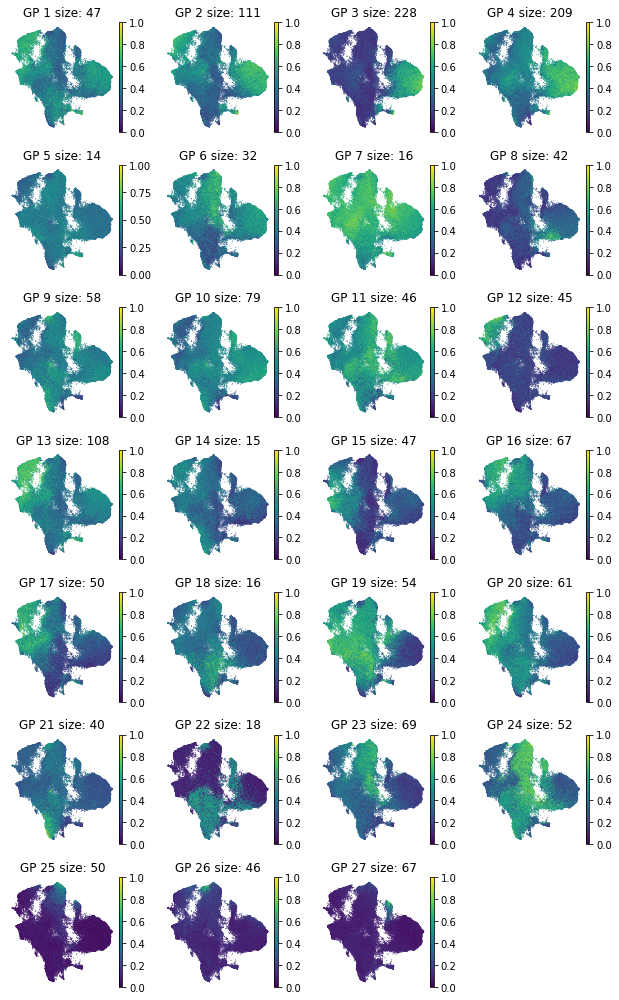

In [14]:
ncols=4
nrows=ceil(adata_genes.obs['hc'].nunique()/ncols)
fig,ax=plt.subplots(nrows,ncols,figsize=(2.2*ncols,2*nrows))
random_indices=np.random.permutation(list(range(adata_rn_b.shape[0])))
idx=0
for gp in [col for col in adata_rn_b.obs.columns 
            if 'gene_score_cluster_hc' in col and '_scaled' in col]:
    i_row=idx//ncols
    i_col=idx%ncols
    gp_int=int(gp.replace('gene_score_cluster_hc','').replace('_scaled',''))
    sc.pl.embedding(adata_rn_b[random_indices,:],'X_umap_opt',color=gp, s=3,sort_order=False,
               title='GP '+str(gp_int)+\
                    ' size: '+str(adata_genes.obs.query('hc==@gp_int').shape[0]),
               ax=ax[i_row,i_col],show=False, frameon=False)
    idx+=1
# remove emnpty plots
while idx<ax.ravel().shape[0]:
    i_row=idx//ncols
    i_col=idx%ncols  
    ax[i_row,i_col].remove()
    idx+=1
fig.tight_layout()
plt.savefig(path_fig+'umap_beta_gpactivity_eopt.png',dpi=300,bbox_inches='tight')

Same as above, but plotting most highly scorring cells on top (and using a UMAP different embedding).

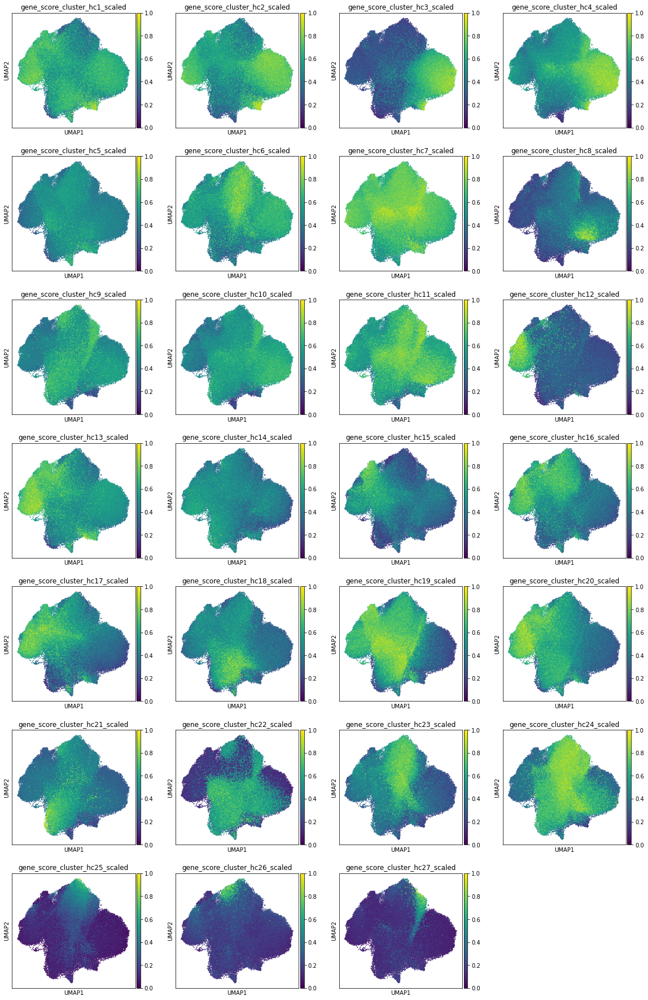

In [87]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_rn_b,color=[col for col in adata_rn_b.obs.columns 
    if 'gene_score_cluster_hc' in col and '_scaled' in col], s=10)

### Gene set enrichment

In [12]:
# Ref genes
ref=adata_rn_b_sub.var['gene_symbol'].dropna().tolist()
ro.globalenv['ref']=ref

# Get gene sets
print('MSIGdb version:',ro.r(f'msigdb_version()'))
gene_sets_go=ro.r(f"msigdb_gsets_custom(species='Mus musculus',category='C5',subcategories=c('GO:BP','GO:CC','GO:MF'),size_range=c(5,500),filter_gene_sets=NULL,background=ref)")
gene_sets_kegg=ro.r(f"msigdb_gsets_custom(species='Mus musculus',category='C2',subcategories=c('KEGG'),size_range=c(5,500),filter_gene_sets=NULL,background=ref)")
gene_sets_reactome=ro.r(f"msigdb_gsets_custom(species='Mus musculus',category='C2',subcategories=c('REACTOME'),size_range=c(5,500),filter_gene_sets=NULL,background=ref)")
%R -i gene_sets_go -i gene_sets_kegg -i gene_sets_reactome -o gene_sets gene_sets=c(gene_sets_go,gene_sets_kegg,gene_sets_reactome)
print('N gene sets:',len(gene_sets))
ro.globalenv['gene_sets']=gene_sets

MSIGdb version: ['v7.4.1']
N gene sets: 10884


CL 1 N genes 47
N enriched gene sets: 32
Top enriched gene sets


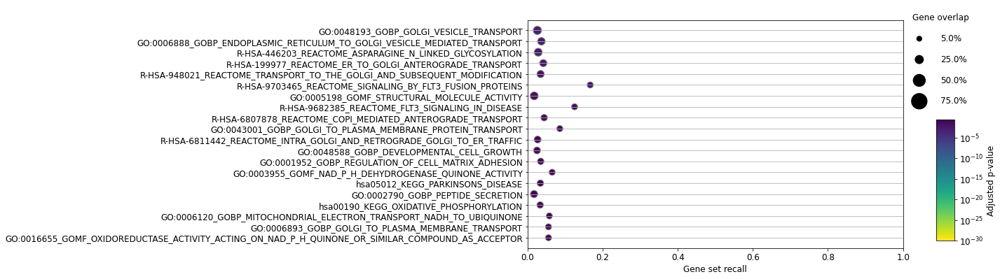

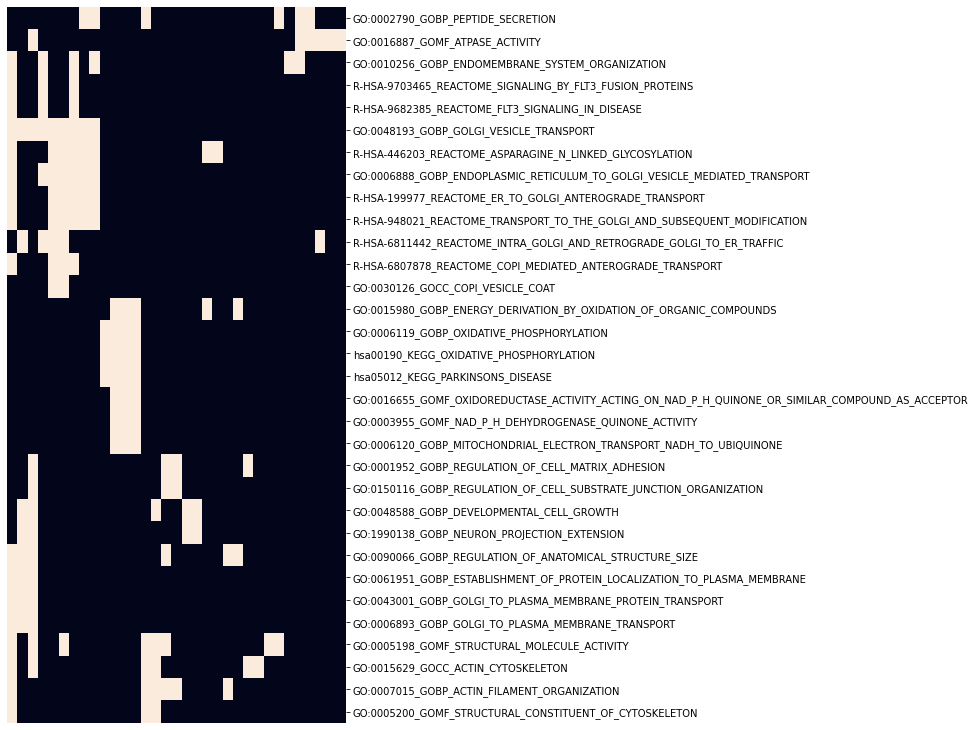

CL 2 N genes 111
N enriched gene sets: 134
Top enriched gene sets


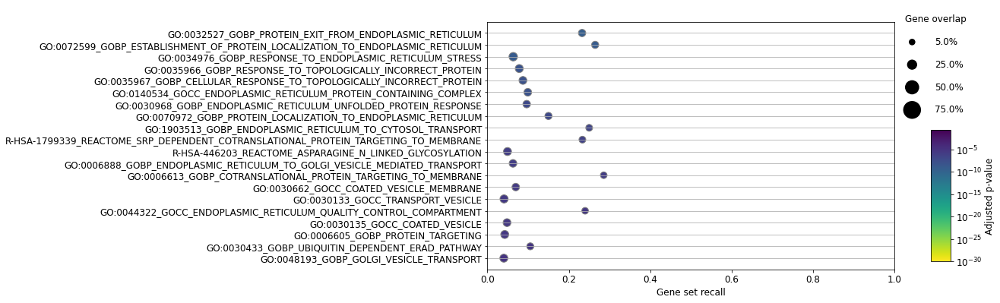

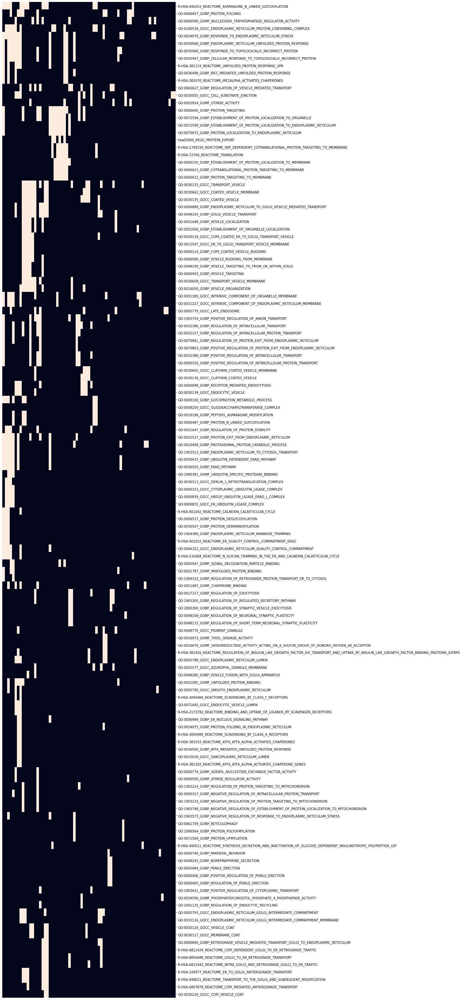

CL 3 N genes 228
N enriched gene sets: 10
Top enriched gene sets


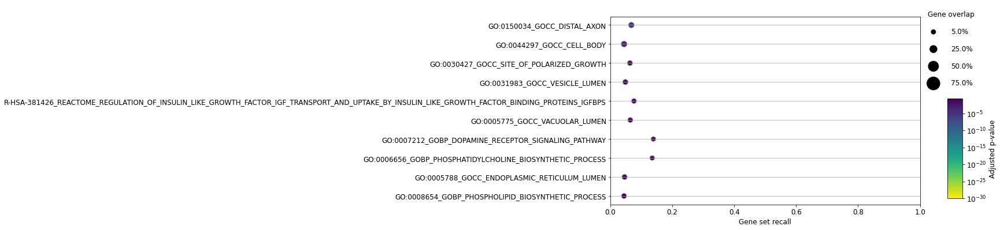

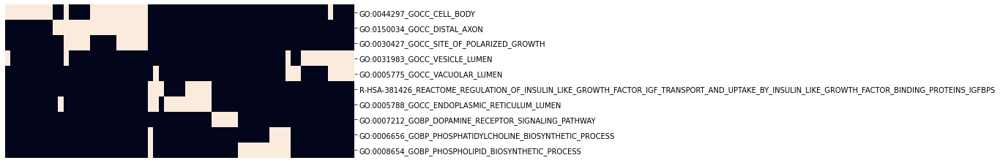

CL 4 N genes 209
N enriched gene sets: 257
Top enriched gene sets


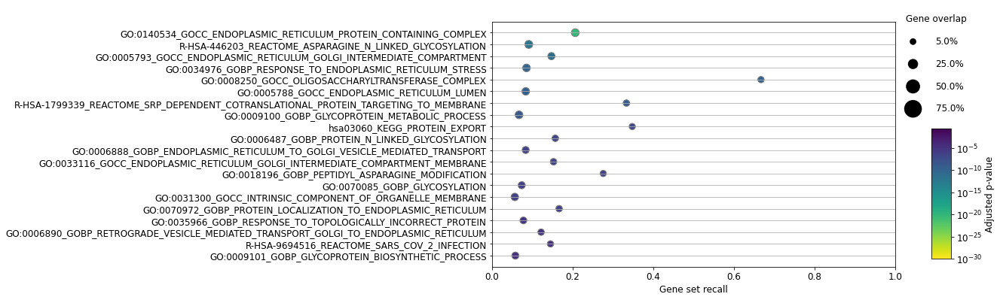

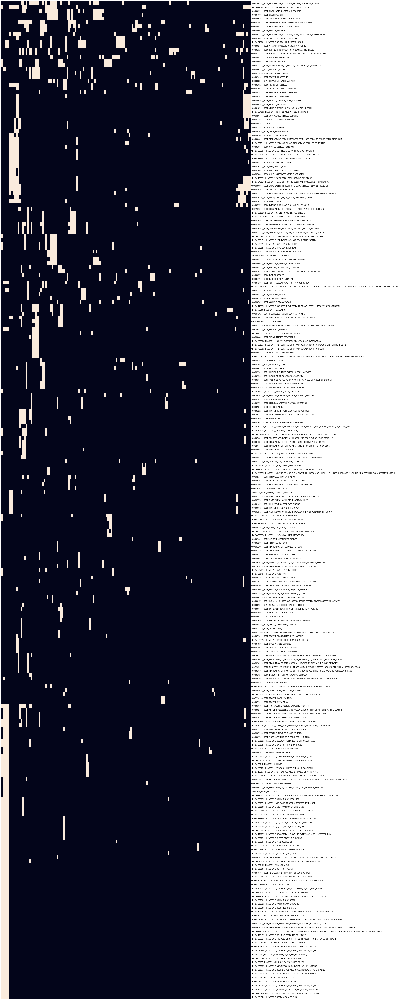

CL 5 N genes 14
N enriched gene sets: 0
CL 6 N genes 32
N enriched gene sets: 0
CL 7 N genes 16
N enriched gene sets: 30
Top enriched gene sets


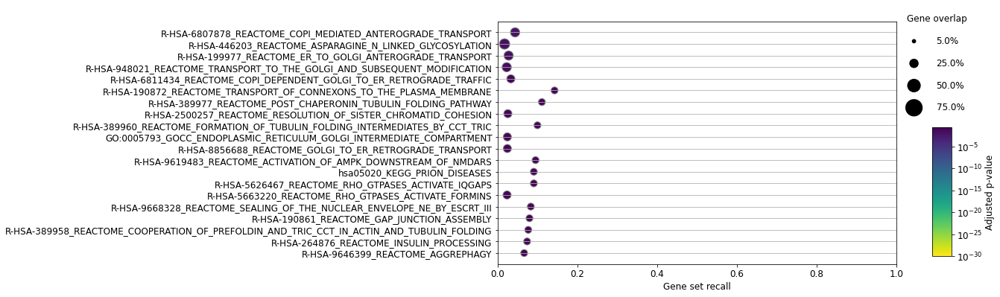

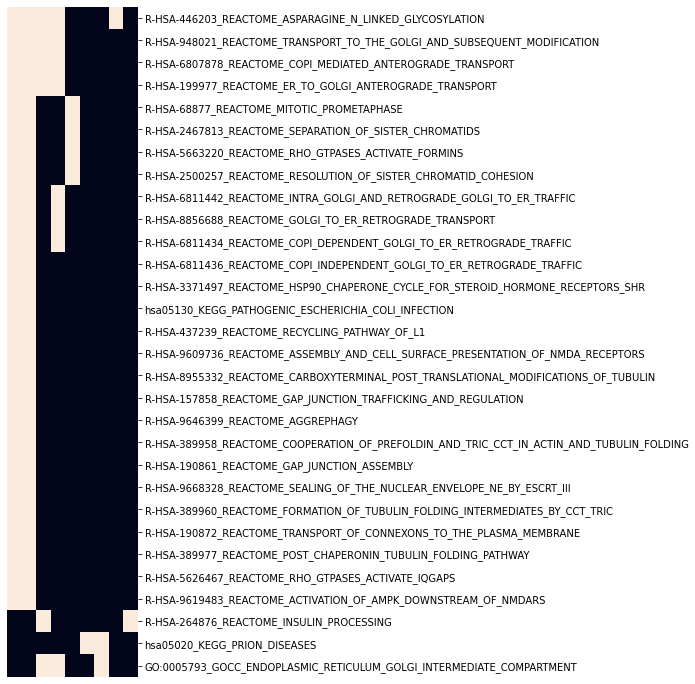

CL 8 N genes 42
N enriched gene sets: 1
Top enriched gene sets


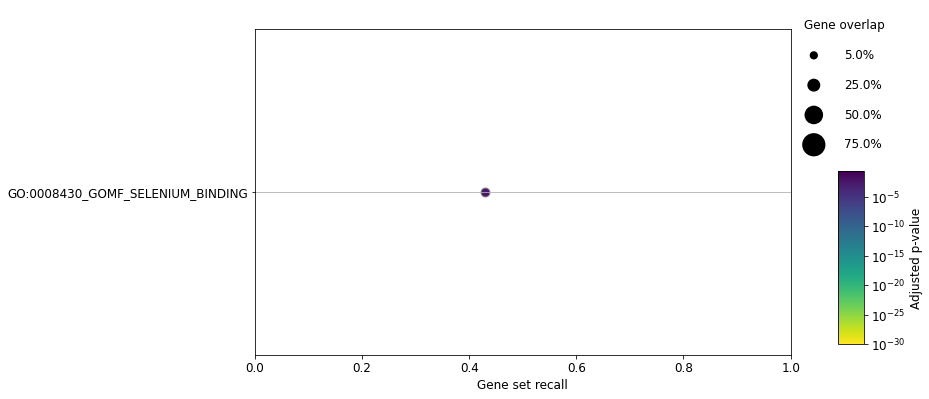

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/matrix.py:712: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/matrix.py:1205: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(**tight_params)


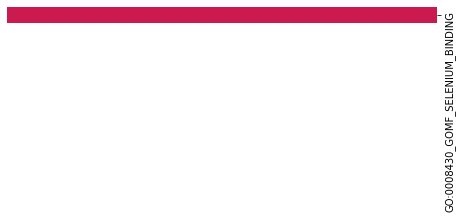

CL 9 N genes 58
N enriched gene sets: 115
Top enriched gene sets


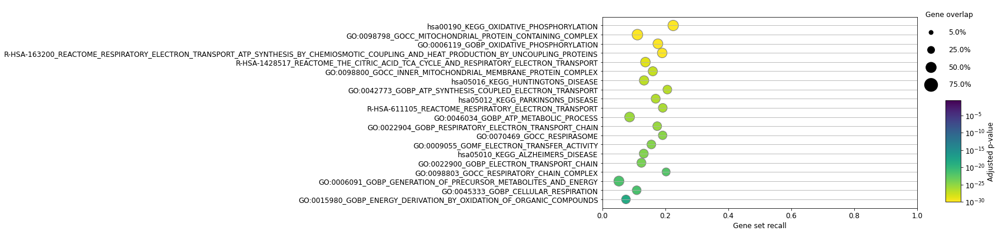

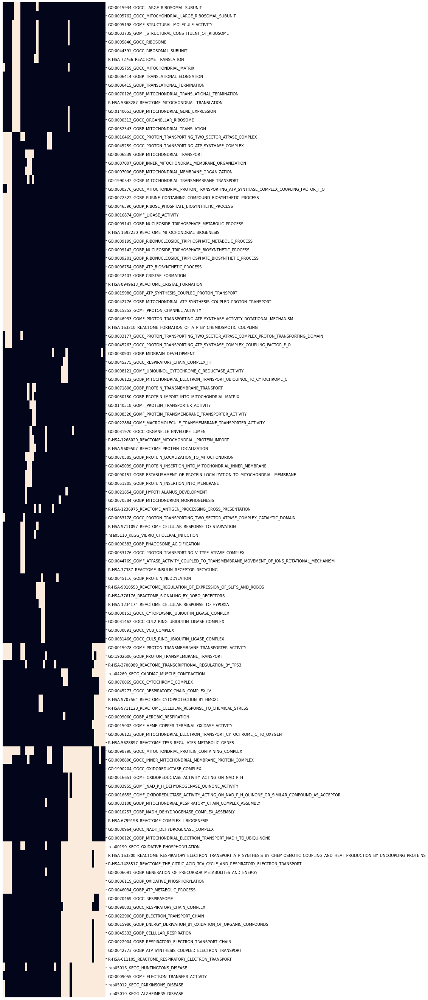

CL 10 N genes 79
N enriched gene sets: 109
Top enriched gene sets


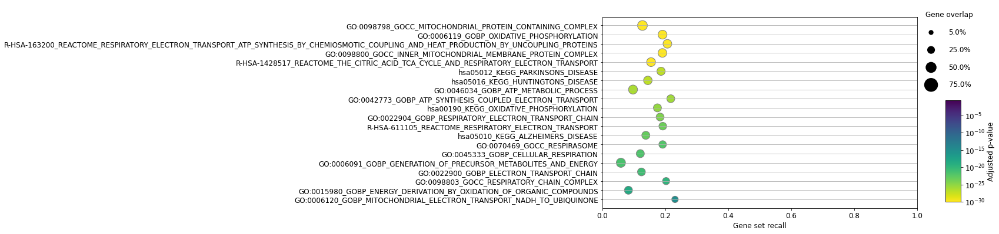

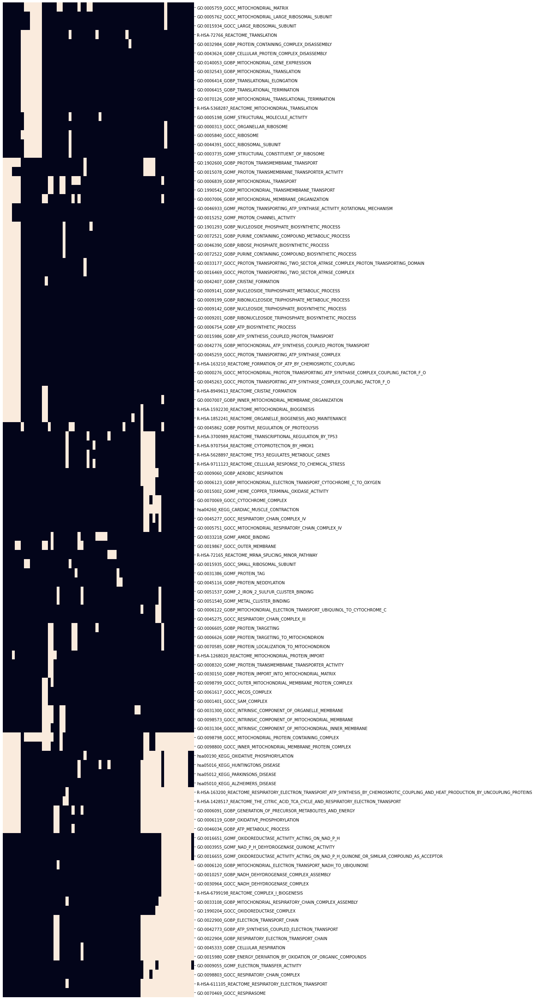

CL 11 N genes 46
N enriched gene sets: 325
Top enriched gene sets


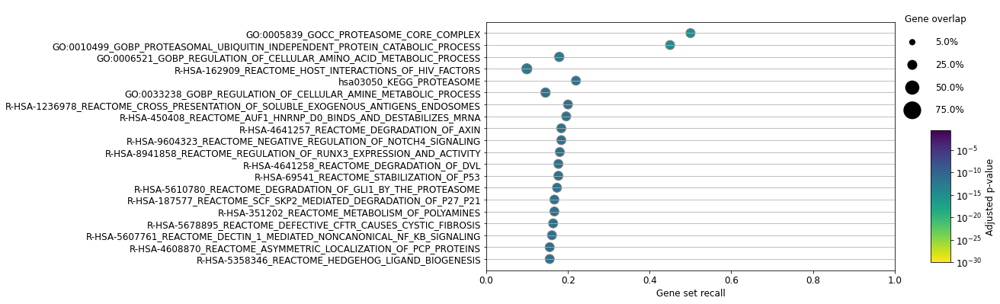

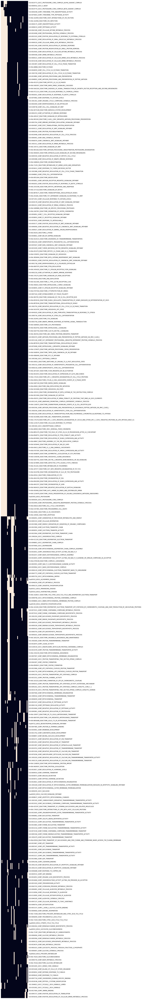

CL 12 N genes 45
N enriched gene sets: 16
Top enriched gene sets


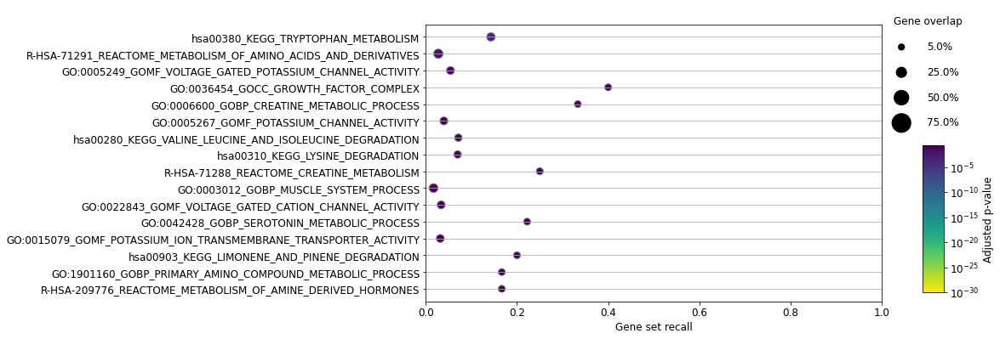

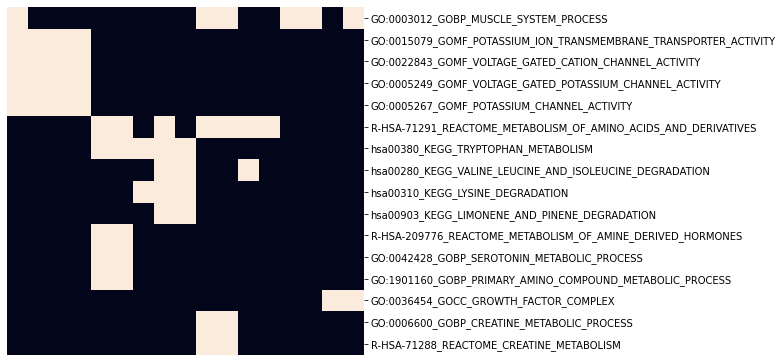

CL 13 N genes 108
N enriched gene sets: 74
Top enriched gene sets


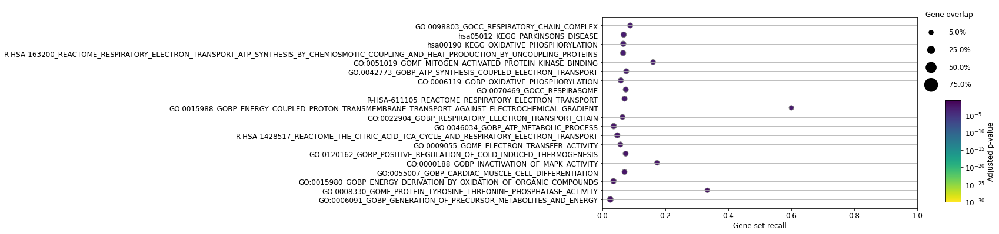

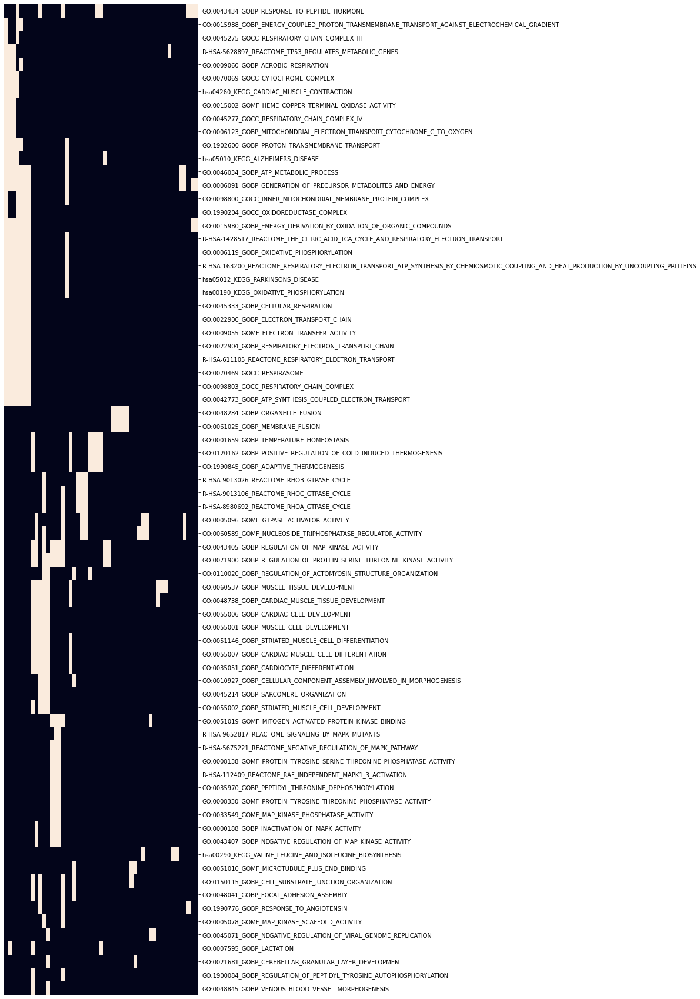

CL 14 N genes 15
N enriched gene sets: 30
Top enriched gene sets


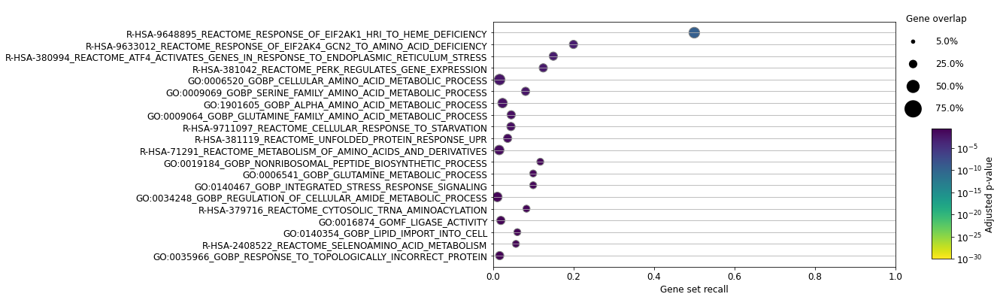

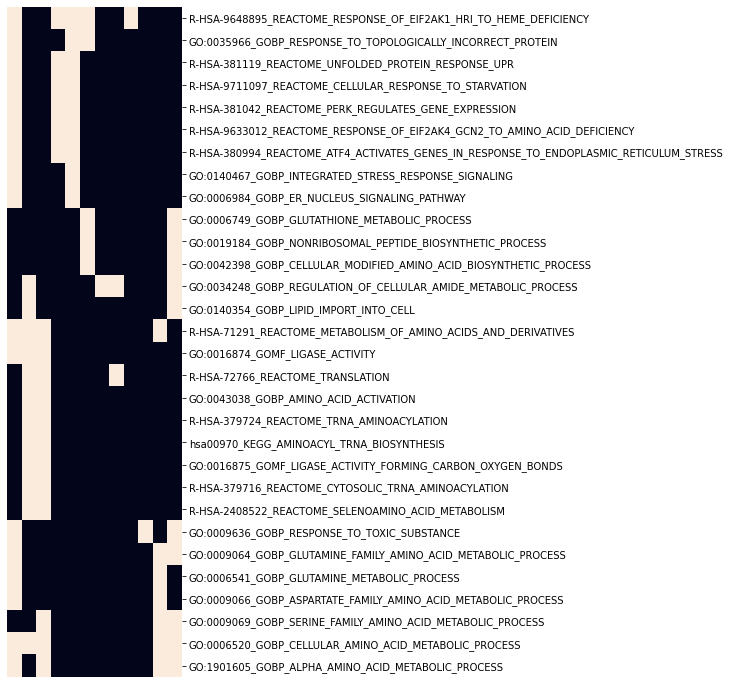

CL 15 N genes 47
N enriched gene sets: 275
Top enriched gene sets


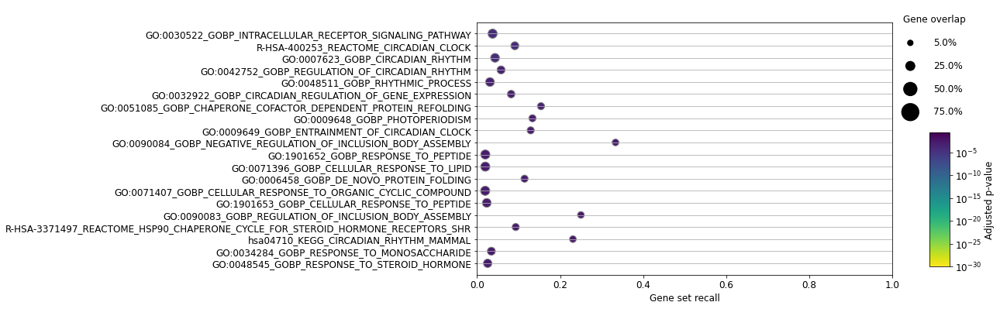

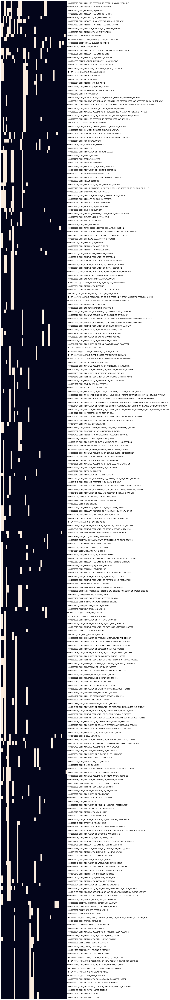

CL 16 N genes 67
N enriched gene sets: 112
Top enriched gene sets


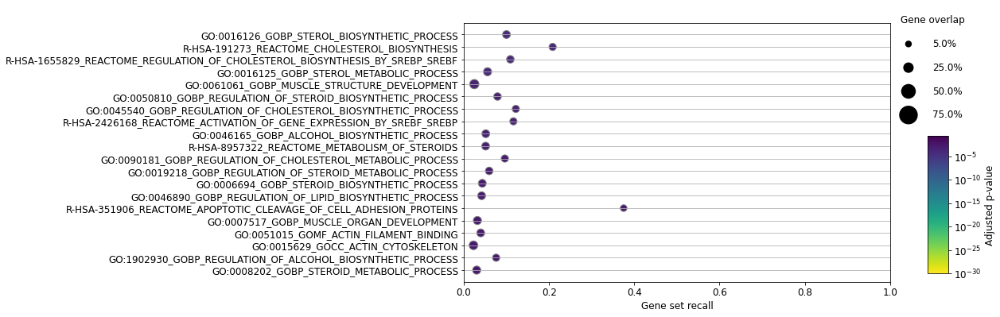

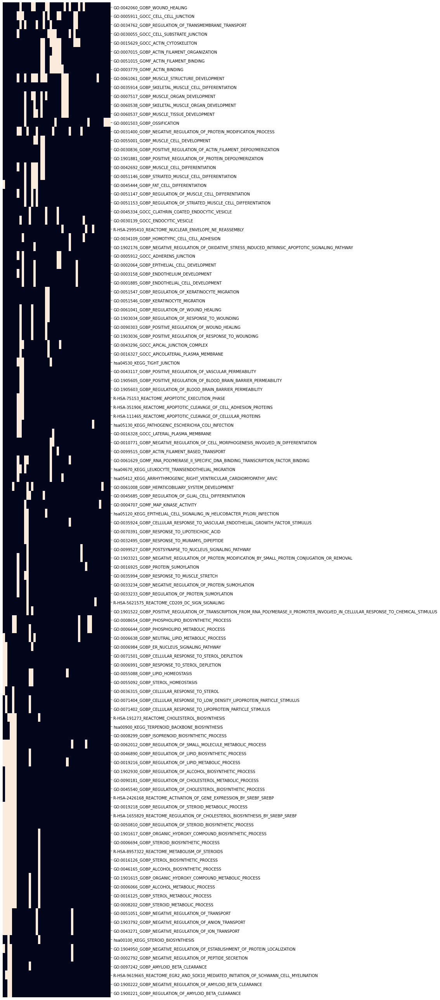

CL 17 N genes 50
N enriched gene sets: 4
Top enriched gene sets


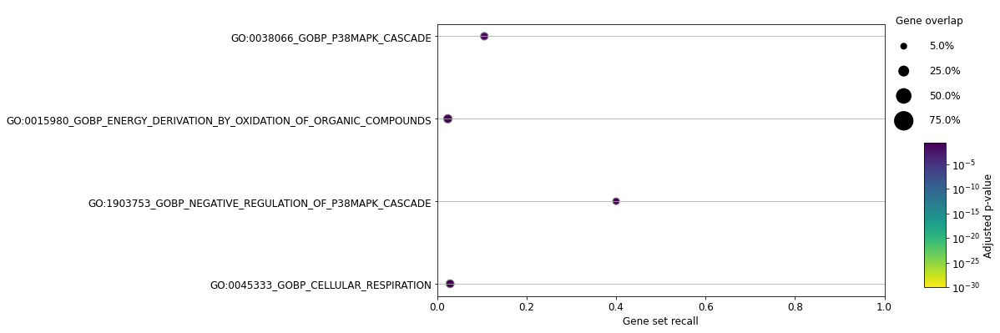

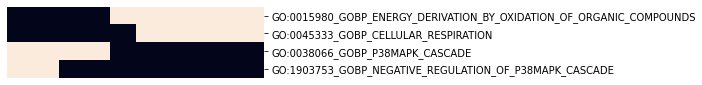

CL 18 N genes 16
N enriched gene sets: 0
CL 19 N genes 54
N enriched gene sets: 24
Top enriched gene sets


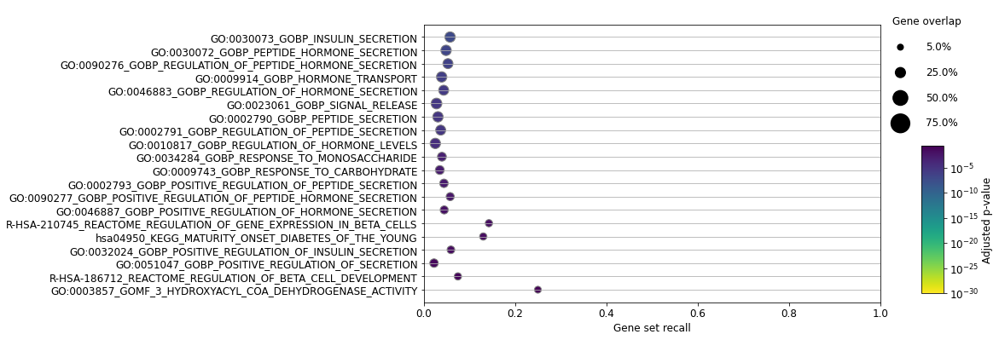

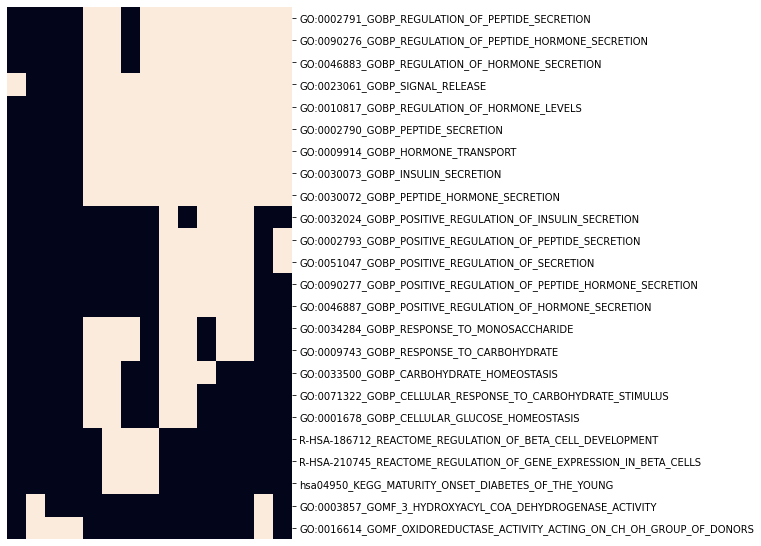

CL 20 N genes 61
N enriched gene sets: 24
Top enriched gene sets


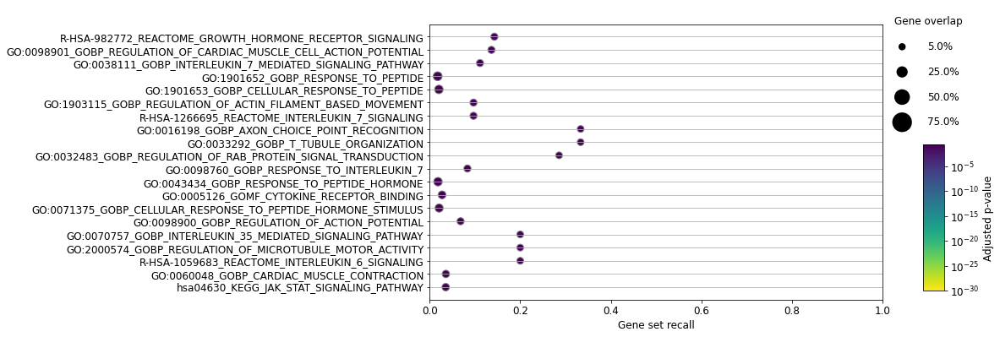

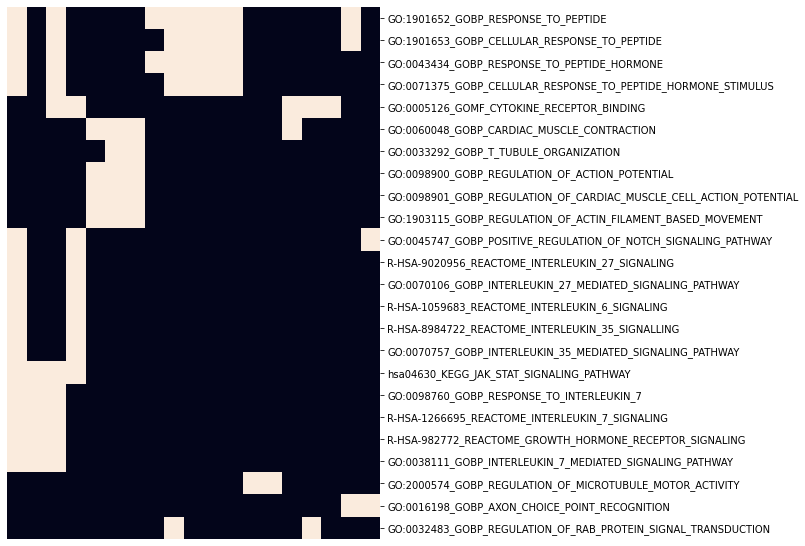

CL 21 N genes 40
N enriched gene sets: 0
CL 22 N genes 18
N enriched gene sets: 0
CL 23 N genes 69
N enriched gene sets: 26
Top enriched gene sets


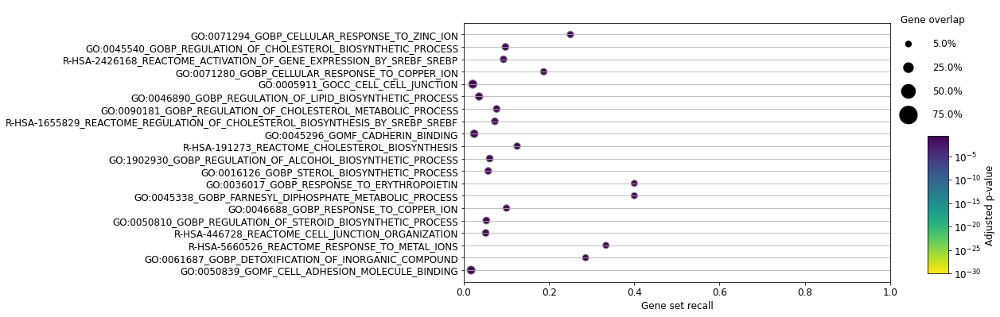

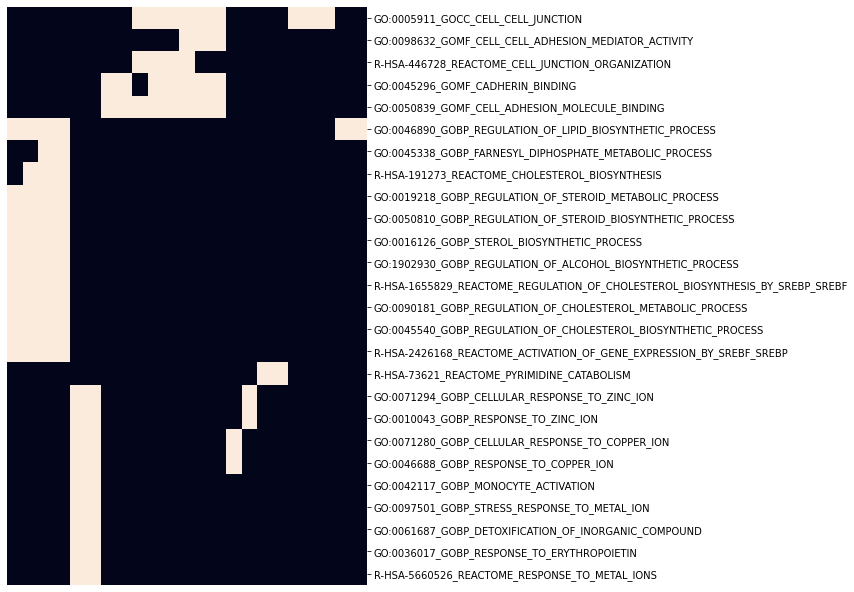

CL 24 N genes 52
N enriched gene sets: 10
Top enriched gene sets


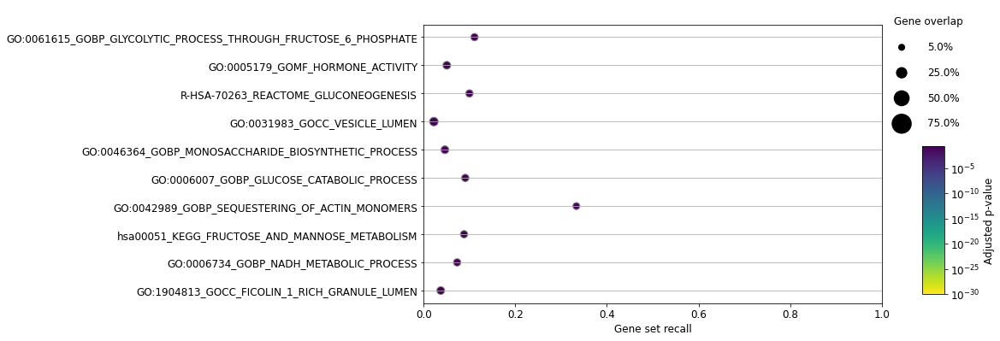

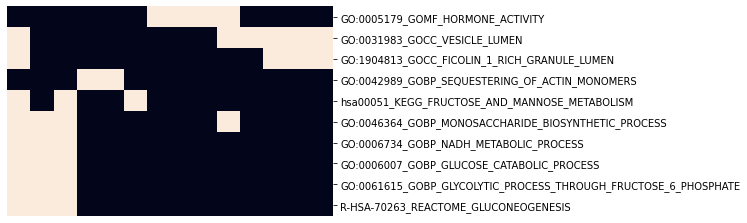

CL 25 N genes 50
N enriched gene sets: 123
Top enriched gene sets


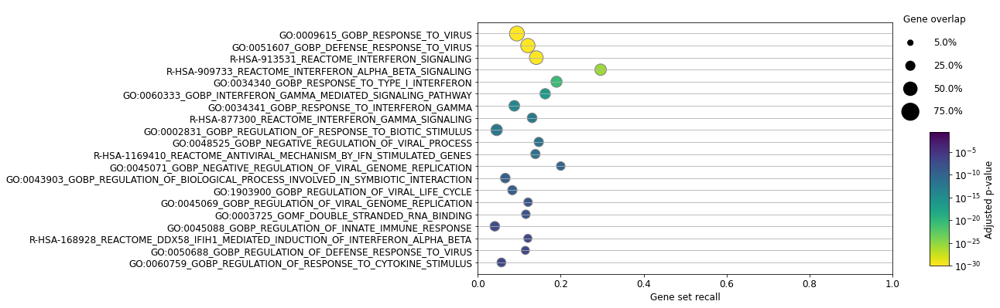

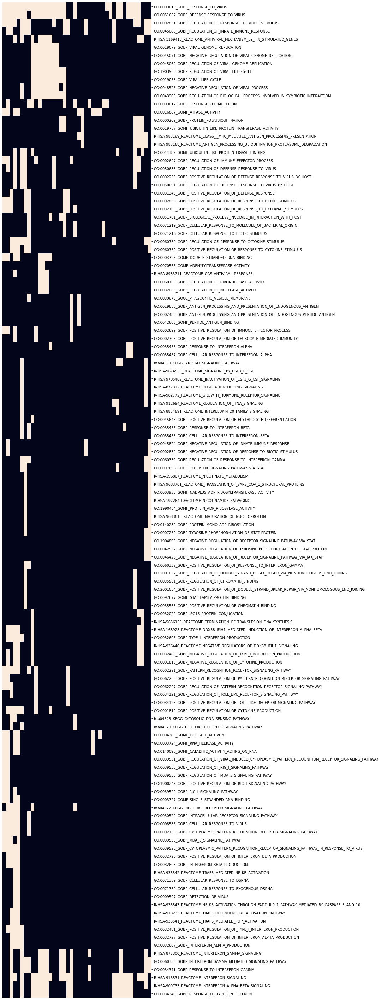

CL 26 N genes 46
N enriched gene sets: 112
Top enriched gene sets


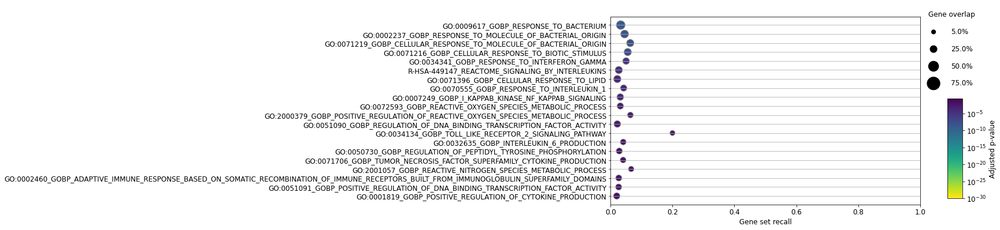

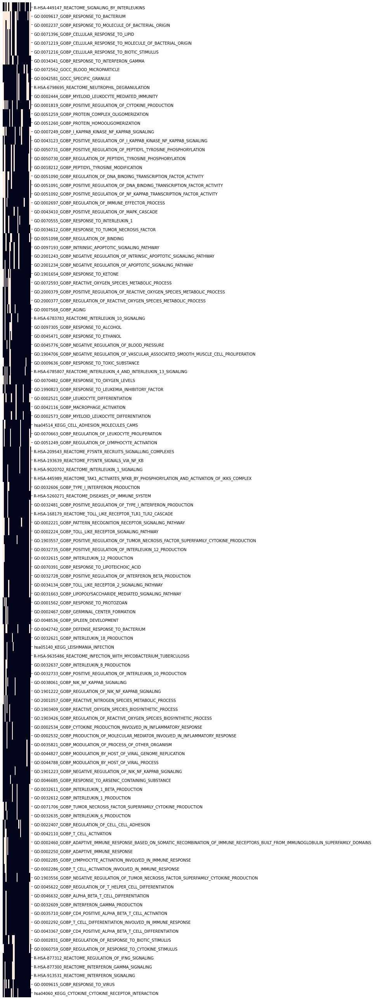

CL 27 N genes 67
N enriched gene sets: 293
Top enriched gene sets


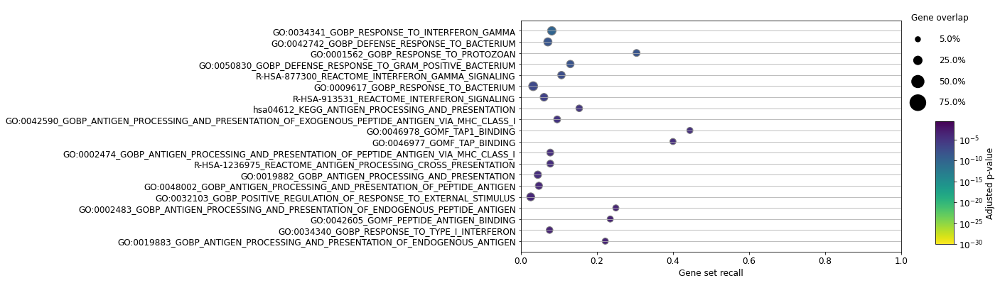

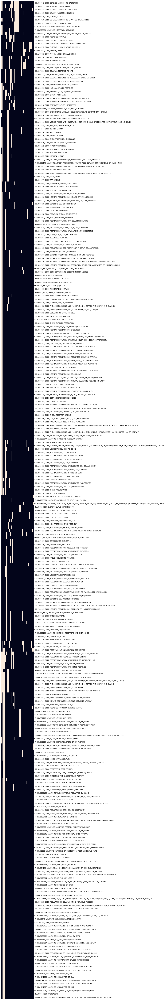

NameError: name 'cut_thresh' is not defined

In [14]:
enrich_fdr=0.25
ro.globalenv['gs_fdr']=enrich_fdr
enrich_datas={}
for cl in sorted(adata_genes.obs['hc'].unique()):
    genes=adata_genes.obs.query('hc==@cl').index
    print('CL %i N genes %i'%(cl,len(genes)))
    # Map to gene symbols
    genes=adata_rn_b_sub.var.loc[genes,'gene_symbol'].dropna().tolist()

    # Calculate enrichment
    ro.globalenv['genes']=genes
    res=ro.r(f'hypeR(signature=as.vector(unlist(genes)),genesets=gene_sets,test = "hypergeometric",background =  as.vector(unlist(ref)),pval = 1,fdr = gs_fdr,plotting = FALSE,quiet = TRUE)')
    ro.globalenv['res']=res
    data=ro.r(f'res$data')
    enrich_datas[cl]=data
    print('N enriched gene sets:',data.shape[0])
    
    if data.shape[0]>0:
        # Plot top enriched gene sets
        print('Top enriched gene sets')
        data['recall']=data['overlap']/data['geneset']
        data['query_size']=len(genes)
        h.plot_enrich(data=data.rename(
            {'label':'name','fdr':'p_value','overlap':'intersection_size'},axis=1),
            n_terms=20, save=False,min_pval=10**-30, max_pval=enrich_fdr,percent_size=True,
               recall_lim=(0,1))
        h.plot_enr_heatmap(data=data,n_gs=None,xticklabels=False,yticklabels=True)
        
# Save enrichment tables
writer = pd.ExcelWriter(path_save+'gene_hc_t'+str(cut_thresh)+'_enrichment.xlsx',
                        engine='xlsxwriter') 
for sheet,data in enrich_datas.items():
    data.to_excel(writer, sheet_name=str(sheet))   
writer.save()

In [17]:
path_save+'gene_hc_t'+str(cut_thresh)+'_enrichment.xlsx'

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/moransi/sfintegrated/gene_hc_t2.4_enrichment.xlsx'

### Analyse gene membership

In [6]:
# Load genes extracted from literature
gene_collection=pd.read_excel('/lustre/groups/ml01/workspace/karin.hrovatin//data/pancreas/gene_lists/summary.xlsx',sheet_name='genes')
markers=pd.read_excel('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/markers.xlsx', 
                      sheet_name='mice')
collected_genes=set([g.lower() for g in gene_collection.Gene.tolist()+markers.Gene.tolist() 
                     if isinstance(g,str)])

Highly cited genes from each gene cluster (using different sets of citations).

In [11]:
# Cited in association with pancreas
for cl in sorted(genes_hc['hc'].unique()):
    genes=genes_hc.query('hc==@cl').index
    genes=genes_info.loc[[g for g in genes if g in genes_info.index],
                   :].sort_values('N_PMID_pancreas',ascending=False
                    ).gene_symbol[:10].values.tolist()
    print(cl,genes)

1 ['Abcc8', 'Abca1', 'Braf', 'Gfpt1', 'Atrx', 'Usp9x', 'Rock2', 'Copa', 'Nedd4', 'Sptbn1']
2 ['Kras', 'Tnfrsf11b', 'Pcsk1', 'Hsp90b1', 'Sel1l', 'Calr', 'Dgkb', 'Bag3', 'Chgb', 'P4hb']
3 ['Prss1', 'Txnip', 'Cd44', 'Gnas', 'Ptprn', 'Pon2', 'Gc', 'Glo1', 'Plagl1', 'Apoa2']
4 ['Iapp', 'Cst3', 'Ccnd1', 'Nucb2', 'Ttr', 'Atp6ap2', 'Cpe', 'Selenos', 'Pdia3', 'Clptm1l']
5 ['mt-Nd1', 'Il1r1', 'Th', 'Eif2s3y', 'Sez6l', 'Rbm39', 'Dbp', 'Nrtn', 'Ddx3y', 'Cib3']
6 ['Rnh1', 'Klf5', 'Anxa5', 'Tpm1', 'Tagln2', 'Fhl2', 'Capsl', 'Serpina10', 'Rraga', 'Rheb']
7 ['Ins2', 'Ins1', 'G6pc2', 'Hspa5', 'Pcsk2', 'Tuba1a', 'Fh1', 'Eif4a2', 'Tubb4b', 'Tmed9']
8 ['Ucp2', 'Ace2', 'Tspan8', 'Gata6', 'S100a4', 'Cpb2', 'Selenop', 'Alpl', 'Gpx3', 'Kcnk16']
9 ['Mif', 'Bax', 'Rbx1', 'Romo1', 'Slirp', 'Ndufa5', 'Mrpl33', 'Elob', 'Cox6b1', 'Uqcr11']
10 ['Cisd1', 'Stub1', 'Srp14', 'Pcbd1', 'Atp5o', 'Cycs', 'Cd63', 'Gsto1', 'Nedd8', 'Pfdn5']
11 ['Chga', 'Pkm', 'Park7', 'Atp5b', 'Ywhaq', 'Akr1a1', 'Psma6', 'Bace2', 'Eif5a', 'Ps

In [17]:
# Cited in association with pancreas but not cancer or non-endo
for cl in sorted(genes_hc['hc'].unique()):
    genes=genes_hc.query('hc==@cl').index
    genes=genes_info.loc[[g for g in genes if g in genes_info.index],
                   :].sort_values('N_PMID_pancreas_notCancerNonendo',ascending=False
                    ).gene_symbol[:10].values.tolist()
    print(cl,genes)

1 ['Abcc8', 'Abca1', 'Gfpt1', 'mt-Nd5', 'Rock2', 'mt-Nd6', 'Cd2ap', 'Copa', 'mt-Nd4l', 'Macf1']
2 ['Tnfrsf11b', 'Pcsk1', 'Dgkb', 'Hsp90b1', 'Sorl1', 'P4hb', 'Calr', 'Sel1l', 'Syp', 'Chgb']
3 ['Ptprn', 'Txnip', 'Pon2', 'Gc', 'Prss1', 'Apoa2', 'Glo1', 'Bscl2', 'Cd59a', 'Gnas']
4 ['Iapp', 'Cst3', 'Nucb2', 'Ttr', 'Cpe', 'Pdia3', 'Selenos', 'Atp6ap2', 'Dnajc3', 'Vkorc1']
5 ['mt-Nd1', 'Th', 'Il1r1', 'Sez6l', 'Eif2s3y', 'Rbm39', 'Dbp', 'Nrtn', 'Ddx3y', 'Cib3']
6 ['Rnh1', 'Anxa5', 'Tpm1', 'Tagln2', 'Klf5', 'Fhl2', 'Capsl', 'Taf6l', 'Rraga', 'Rheb']
7 ['Ins2', 'Ins1', 'G6pc2', 'Hspa5', 'Pcsk2', 'Fh1', 'Tuba1a', 'Eif4a2', 'Tubb4b', 'Tmed9']
8 ['Ucp2', 'Ace2', 'Tspan8', 'Cpb2', 'Gata6', 'Selenop', 'Alpl', 'Kcnk16', 'Gpx3', 'Hmgcs2']
9 ['Mif', 'Bax', 'Romo1', 'Slirp', 'Mrpl33', 'Ndufb4', 'Ndufa5', 'Ndufb7', 'Rbx1', 'Timm8b']
10 ['Cisd1', 'Pcbd1', 'Atp5o', 'Srp14', 'Stub1', 'Gsto1', 'Uqcrfs1', 'Ubl5', 'Ndufb6', 'Atp5j']
11 ['Chga', 'Pkm', 'Psma6', 'Bace2', 'Atp5b', 'Akr1a1', 'Ywhaq', 'Park7', 'Slc2

Relative expression in beta cells across clusters. May indicate batch-related ambience contribution to gene groups.

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 36.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 60.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 59.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 66.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warn

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning: 41.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='hc', ylabel='rel_maxscl_beta_expr'>

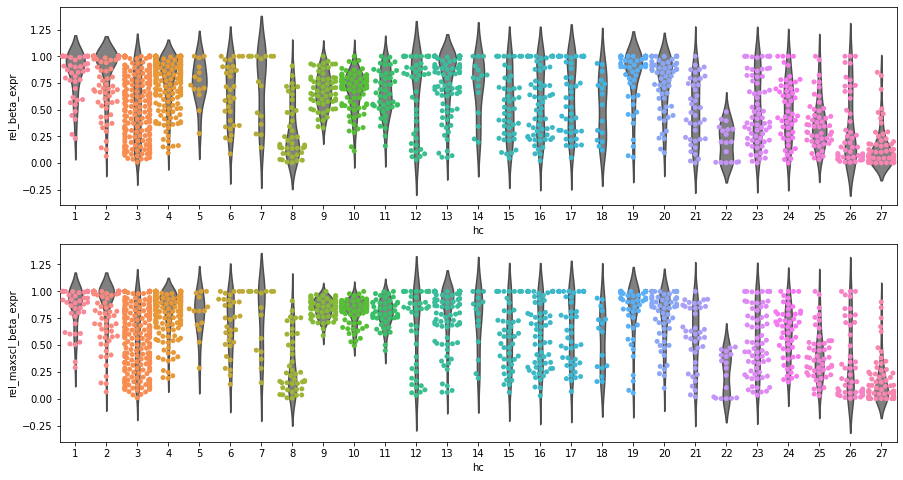

In [13]:
fig,ax=plt.subplots(2,1,figsize=(15,8))
sb.violinplot(x=genes_hc['hc'],y=genes_info.loc[genes_hc.index,'rel_beta_expr'],
             inner=None,color='gray',ax=ax[0])
sb.swarmplot(x=genes_hc['hc'],y=genes_info.loc[genes_hc.index,'rel_beta_expr'],
             ax=ax[0])
sb.violinplot(x=genes_hc['hc'],
              y=genes_info.loc[genes_hc.index,'rel_maxscl_beta_expr'],
             inner=None,color='gray',ax=ax[1])
sb.swarmplot(x=genes_hc['hc'],
             y=genes_info.loc[genes_hc.index,'rel_maxscl_beta_expr'],
             ax=ax[1])

Genes with high relative beta expression and high number of N PMIDs (associated with pancreas/dibates - top or unfiltered papers - bottom.

In [15]:
for cl in sorted(genes_hc['hc'].unique()):
    genes=genes_hc.query('hc==@cl').index
    genes=genes_info.loc[[g for g in genes if g in genes_info.index],
                   :].query('rel_maxscl_beta_expr>0.45'
                           ).sort_values('N_PMID_pancreas',ascending=False
                    ).gene_symbol[:10].values.tolist()
    print(cl,genes)

1 ['Abcc8', 'Abca1', 'Braf', 'Gfpt1', 'Atrx', 'Usp9x', 'Rock2', 'Copa', 'Nedd4', 'mt-Nd5']
2 ['Kras', 'Tnfrsf11b', 'Pcsk1', 'Hsp90b1', 'Sel1l', 'Bag3', 'Calr', 'Chgb', 'P4hb', 'Sorl1']
3 ['Txnip', 'Gnas', 'Cd44', 'Ptprn', 'Gc', 'Glo1', 'Apoa2', 'Plagl1', 'Cck', 'Gast']
4 ['Iapp', 'Cst3', 'Ccnd1', 'Nucb2', 'Ttr', 'Atp6ap2', 'Cpe', 'Selenos', 'Pdia3', 'Dnajc3']
5 ['mt-Nd1', 'Il1r1', 'Th', 'Eif2s3y', 'Sez6l', 'Rbm39', 'Dbp', 'Nrtn', 'Ddx3y', 'Cib3']
6 ['Rnh1', 'Anxa5', 'Tagln2', 'Serpina10', 'Rraga', 'Rheb', 'Cfap20', 'Lmo1', 'Taf6l', 'Coro1b']
7 ['Ins2', 'Ins1', 'G6pc2', 'Hspa5', 'Pcsk2', 'Tuba1a', 'Fh1', 'Eif4a2', 'Tmed9', 'Pycr2']
8 ['Ucp2', 'Selenop', 'Kcnk16', 'H1f2', 'Rab3b', 'Tspan7', 'Pdzk1ip1', 'Aplp1', 'Eci2', 'Dio1']
9 ['Mif', 'Bax', 'Rbx1', 'Romo1', 'Slirp', 'Ndufa5', 'Mrpl33', 'Elob', 'Cox6b1', 'Uqcr11']
10 ['Cisd1', 'Stub1', 'Srp14', 'Pcbd1', 'Atp5o', 'Cycs', 'Cd63', 'Gsto1', 'Nedd8', 'Pfdn5']
11 ['Chga', 'Pkm', 'Park7', 'Atp5b', 'Ywhaq', 'Akr1a1', 'Psma6', 'Bace2', 'Eif5a',

Same as above, but removing genes that may be more likely ambient (relatively low expr in beta cells).

In [20]:
for cl in sorted(genes_hc['hc'].unique()):
    genes=genes_hc.query('hc==@cl').index
    genes=genes_info.loc[[g for g in genes if g in genes_info.index],
                   :].query('rel_maxscl_beta_expr>0.45' ).sort_values('N_PMID_pancreas_notCancerNonendo',ascending=False
                    ).gene_symbol[:10].values.tolist()
    print(cl,genes)

1 ['Abcc8', 'Abca1', 'Gfpt1', 'mt-Nd5', 'Rock2', 'mt-Nd6', 'Copa', 'mt-Nd4l', 'Nedd4', 'Macf1']
2 ['Tnfrsf11b', 'Pcsk1', 'Hsp90b1', 'Sorl1', 'Calr', 'P4hb', 'Sel1l', 'Syp', 'Crem', 'Chgb']
3 ['Ptprn', 'Txnip', 'Gc', 'Apoa2', 'Glo1', 'Bscl2', 'Gnas', 'Cck', 'Ptprn2', 'Fabp3']
4 ['Iapp', 'Cst3', 'Nucb2', 'Ttr', 'Cpe', 'Pdia3', 'Selenos', 'Atp6ap2', 'Vkorc1', 'Dnajc3']
5 ['mt-Nd1', 'Th', 'Il1r1', 'Sez6l', 'Eif2s3y', 'Rbm39', 'Dbp', 'Nrtn', 'Ddx3y', 'Cib3']
6 ['Rnh1', 'Anxa5', 'Tagln2', 'Taf6l', 'Rraga', 'Rheb', 'Lmo1', 'Serpina10', 'Tbrg1', 'Nxf1']
7 ['Ins2', 'Ins1', 'G6pc2', 'Hspa5', 'Pcsk2', 'Fh1', 'Tuba1a', 'Eif4a2', 'Tmed9', 'Pycr2']
8 ['Ucp2', 'Selenop', 'Kcnk16', 'Rab3b', 'H1f2', 'Tspan7', 'Dio1', 'Pdzk1ip1', 'Aplp1', 'Eci2']
9 ['Mif', 'Bax', 'Romo1', 'Slirp', 'Mrpl33', 'Ndufb4', 'Ndufa5', 'Ndufb7', 'Rbx1', 'Timm8b']
10 ['Cisd1', 'Pcbd1', 'Atp5o', 'Srp14', 'Stub1', 'Gsto1', 'Uqcrfs1', 'Ubl5', 'Ndufb6', 'Atp5j']
11 ['Chga', 'Pkm', 'Psma6', 'Bace2', 'Atp5b', 'Akr1a1', 'Ywhaq', 'Park7'

In [16]:
for cl in sorted(genes_hc['hc'].unique()):
    genes=genes_hc.query('hc==@cl').index
    genes=genes_info.loc[[g for g in genes if g in genes_info.index],
                   :].query('rel_maxscl_beta_expr>0.45' ).sort_values('N_PMID',ascending=False
                    ).gene_symbol[:10].values.tolist()
    print(cl,genes)

1 ['Braf', 'Abca1', 'Nedd4', 'Atrx', 'Abcc8', 'Rock2', 'Usp9x', 'Eif3a', 'Copa', 'Smarcc2']
2 ['Kras', 'Tnfrsf11b', 'Calr', 'Hsp90b1', 'Birc2', 'Prkar1a', 'Bag3', 'P4hb', 'Sorl1', 'Rpn1']
3 ['Mapt', 'Cd44', 'Gnas', 'Ntrk2', 'Gc', 'Aqp4', 'Txnip', 'Lgals3bp', 'Gstm5', 'Apoa2']
4 ['Ccnd1', 'Ttr', 'Cst3', 'Calm1', 'Vkorc1', 'Nme1', 'Iapp', 'Pdia3', 'Ubb', 'Cd47']
5 ['Il1r1', 'Th', 'Rbm39', 'mt-Nd1', 'Eif2s3y', 'Ddx3y', 'Dbp', 'Gmpr', 'Nrtn', 'Sez6l']
6 ['Anxa5', 'Rheb', 'Nxf1', 'Brms1', 'Tagln2', 'Rnh1', 'Creb3', 'Coro1b', 'Morf4l2', 'Rraga']
7 ['Ins2', 'Ins1', 'Hspa5', 'Tuba1a', 'Fh1', 'Eif4a2', 'Pcsk2', 'Pycr2', 'G6pc2', 'Tmed9']
8 ['Ucp2', 'H1f2', 'Selenop', 'Dio1', 'Eci2', 'Aplp1', 'Fbxo2', 'Tspan7', 'Rab3b', 'Pdzk1ip1']
9 ['Bax', 'Mif', 'Rbx1', 'Elob', 'Polr2f', 'S100a1', 'Slirp', 'Ndufa5', 'Atp5j2', 'Atp5l']
10 ['Stub1', 'Nedd8', 'Cd63', 'Psmb5', 'Cycs', 'Vdac2', 'Polr2g', 'Gsto1', 'Ndufa13', 'Gabarapl2']
11 ['Pkm', 'Park7', 'Ywhaq', 'Sdhb', 'Chga', 'Prdx2', 'Atp5b', 'Slc25a5', 'Psm

C: Some gene clusters seem to be comprised also of likely ambient genes. However, there might be non-ambient genes following the same pattern.

Compare expression of example genes from cluster 8 with high or low relative expression in beta cells. First half of plotted genes has relatively high expression in beta cells and second half relatively low.

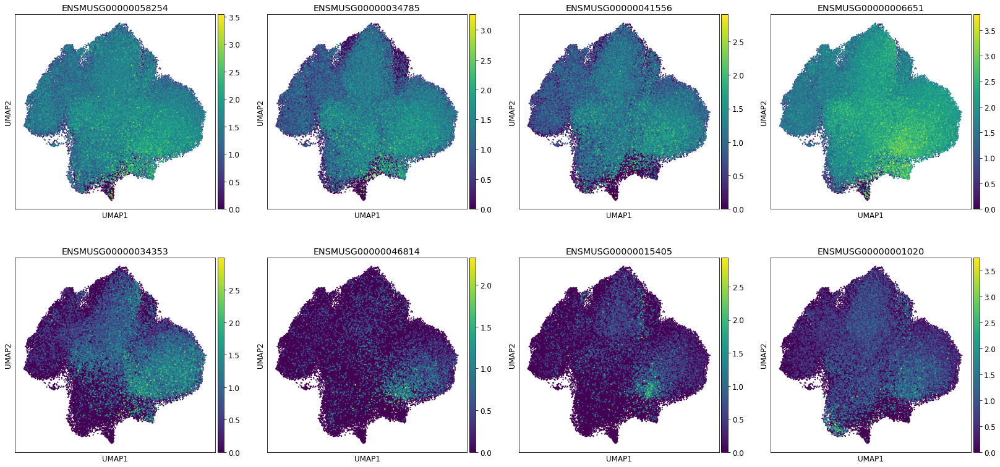

In [45]:
rcParams['figure.figsize']=(6,6)
genes=adata_genes.obs.query('hc==8').index
sc.pl.umap(adata_rn_b,s=20,
           color=genes_info.loc[genes,:].query('rel_beta_expr>0.5').index[:4].tolist()+\
           genes_info.loc[genes,:].query('rel_beta_expr<0.25').index[:4].tolist()
          )

C: Genes seem to have similar pattern. Possible reasons for relatively low expression in beta cells could be: expression only in beta subset, ambience. It would be better to here use relative expression score that is based on cell clusters rather than cell vtypes.

## Save gene cls

In [24]:
# Add symbols and save
genes_hc_data=adata_genes.obs['hc'].to_frame()
genes_hc_data['gene_symbol']=adata_rn_b_sub.var.loc[genes_hc_data.index,'gene_symbol']
genes_hc_data['rel_beta_expr']=genes_info.loc[
    genes_hc_data.index,'rel_maxscl_beta_expr_cl'].values
genes_hc_data[['mean_expr_in_expr_cells','N_PMID','N_PMID_pancreas_notCancerNonendo']]=\
    genes_info.loc[genes_hc_data.index,
                   ['mean_expr_in_expr_cells','N_PMID','N_PMID_pancreas_notCancerNonendo']]
genes_hc_data.to_csv(path_save+'gene_hc_t'+str(cut_thresh)+'.tsv',sep='\t')

In [25]:
genes_hc_data

,hc,gene_symbol,rel_beta_expr,mean_expr_in_expr_cells,N_PMID,N_PMID_pancreas_notCancerNonendo
ENSMUSG00000025907,1,Rb1cc1,1.0,0.808519,124.0,1.0
ENSMUSG00000099032,2,Tcf24,1.0,0.605948,7.0,0.0
ENSMUSG00000025935,2,Tram1,1.0,1.637445,44.0,3.0
ENSMUSG00000042215,17,Bag2,1.0,0.675964,169.0,0.0
ENSMUSG00000026131,13,Dst,1.0,1.273423,135.0,1.0
...,...,...,...,...,...,...
ENSMUSG00000064363,13,mt-Nd4,1.0,3.757161,79.0,6.0
ENSMUSG00000064367,1,mt-Nd5,1.0,2.021609,70.0,5.0
ENSMUSG00000064368,1,mt-Nd6,1.0,0.684435,42.0,4.0
ENSMUSG00000064370,13,mt-Cytb,1.0,4.252210,39.0,5.0


In [9]:
#cut_thresh=2.4
path_save+'gene_hc_t'+str(cut_thresh)+'.tsv'

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/moransi/sfintegrated/gene_hc_t2.4.tsv'